<a href="https://colab.research.google.com/github/aleeseyon/GEOP592/blob/main/Physics_guided_RWPGNN_FINAL.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Direct Multi-Property Petrophysical Inversion from Pre-Stack Seismic Data
## Physics-Informed SVD–CNN Framework | Smeaheia Synthetic Dataset

**References:**
- Corrales, Hoteit & Ravasi (2024) — Seis2Rock, *Earth and Space Science*
- Das & Mukerji (2020) — PetroNet, *Geophysics* 85(5)

---
**Run order:** Part 0 → Part 1 → Part 2 → Part 3 → Part 4  
Upload `smeaheia_synthetic.npz` to `/content/` before running.


## Part 0 — Setup

In [ ]:
!git clone --quiet https://github.com/DeepWave-KAUST/Seis2Rock.git
!pip install pylops --quiet
!pip install lasio --quiet
!pip install -e ./Seis2Rock

fatal: destination path 'Seis2Rock' already exists and is not an empty directory.
Obtaining file:///content/Seis2Rock
  Installing build dependencies ... done
  Checking if build backend supports build_editable ... done
  Getting requirements to build editable ... done
  Preparing editable metadata (pyproject.toml) ... done
  Building editable for seis2rock (pyproject.toml) ... done
  Created wheel for seis2rock: filename=seis2rock-0.0.0-0.editable-py3-none-any.whl size=5449 sha256=471031fdb8546152daa7dfa89dd40c2dc2749c0f7207b5ca0bf7b4709ff82efe
  Stored in directory: /tmp/pip-ephem-wheel-cache-8jxfdyqc/wheels/5c/ce/c0/c417b027c7cc3bd33c9697ae850821b0b5678b056cb81b2640
Successfully built seis2rock
  Attempting uninstall: seis2rock
    Found existing installation: seis2rock 0.0.0
    Uninstalling seis2rock-0.0.0:
      Successfully uninstalled seis2rock-0.0.0


In [ ]:
import sys
sys.path.insert(0, './Seis2Rock')

# ── Core imports ─────────────────────────────────────────────────────────────
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import copy, warnings
warnings.filterwarnings('ignore')

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import TensorDataset, DataLoader

from sklearn.metrics import mean_squared_error, r2_score
from scipy.signal import coherence as sp_coherence

# ── PyLops — wildcard imports exactly as reference ────────────────────────────
import pylops
from pylops.utils.wavelets            import *
from pylops.basicoperators            import *
from pylops.signalprocessing          import *
from pylops.avo.avo                   import *
from pylops.avo.poststack             import *
from pylops.optimization.leastsquares import *

# ── Seis2Rock package ─────────────────────────────────────────────────────────
from seis2rock.pem_seis2rock      import pem_seis2rock
from seis2rock.seis2rock_functions import (
    create_background_models_synthetic,
    avo_synthetic_gather_2D,
    extract_well_logs_from_2D,
    Seis2Rock_training,
    Seis2Rock_inference,
)
from seis2rock.seis2rock_utils import (
    plot_petrophysical_2D_sections,
    plot_elastic_2D_sections,
    plot_inversion_results_2D,
    plot_well_results_2Dsynthethic,
    plot_compare_b_reflectivities,
    plot_set_logs,
)

np.random.seed(42)
torch.manual_seed(42)
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
plt.rcParams.update({'figure.dpi': 100, 'font.size': 11})
print(f"PyLops {pylops.__version__} | PyTorch {torch.__version__} | device: {DEVICE}")

PyLops 2.6.0 | PyTorch 2.10.0+cu128 | device: cuda


Grid  : 225 depth samples x 174 traces
Depth : 3500 - 6000 m
phi   : [0.080, 0.354]
Vsh   : [0.030, 1.000]
Sw    : [0.303,  1.000] 


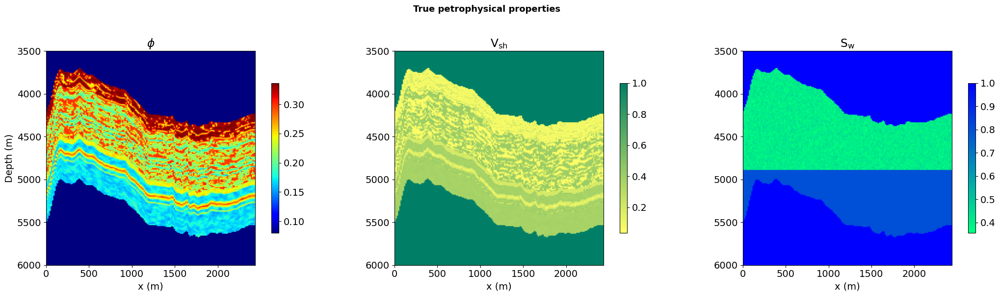

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import copy, warnings
warnings.filterwarnings('ignore')

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import TensorDataset, DataLoader

from sklearn.metrics import mean_squared_error, r2_score
from scipy.signal import coherence as sp_coherence

# ── PyLops — wildcard imports exactly as reference ────────────────────────────
import pylops
from pylops.utils.wavelets            import *
from pylops.basicoperators            import *
from pylops.signalprocessing          import *
from pylops.avo.avo                   import *
from pylops.avo.poststack             import *
from pylops.optimization.leastsquares import *

# ── Seis2Rock package ─────────────────────────────────────────────────────────
from seis2rock.pem_seis2rock      import pem_seis2rock
from seis2rock.seis2rock_functions import (
    create_background_models_synthetic,
    avo_synthetic_gather_2D,
    extract_well_logs_from_2D,
    Seis2Rock_training,
    Seis2Rock_inference,
)
from seis2rock.seis2rock_utils import (
    plot_petrophysical_2D_sections,
    plot_elastic_2D_sections,
    plot_inversion_results_2D,
    plot_well_results_2Dsynthethic,
    plot_compare_b_reflectivities,
    plot_set_logs,
)

np.random.seed(42)
torch.manual_seed(42)
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
plt.rcParams.update({'figure.dpi': 100, 'font.size': 11})
print(f"PyLops {pylops.__version__} | PyTorch {torch.__version__} | device: {DEVICE}")

# ── Load Smeaheia synthetic dataset ──────────────────────────────────────────
# Edit SMEAHEIA_PATH below to run outside Colab. Default works on Colab after
# `from google.colab import files; files.upload()` (uncomment if needed).
# from google.colab import files; files.upload()
SMEAHEIA_PATH = 'smeaheia_synthetic.npz'   # change for local runs

f = np.load(SMEAHEIA_PATH, allow_pickle=True)

phi_2D          = f['phi'].astype(np.float32)
vsh_2D          = f['vsh'].astype(np.float32)
sw_2D           = f['sw'].astype(np.float32)
sw_displaced_2D = f['sw_displaced'].astype(np.float32)
depth           = f['depth']
x_axis          = f['x_axis']
NT, NX          = phi_2D.shape   # (225, 174)

# The problematic lines below are now commented out.
# BASE = 'smeaheia_synthetic.npz'   # the folder path

# phi_2D          = np.load(f'{BASE}/phi.npy').astype(np.float32)
# vsh_2D          = np.load(f'{BASE}/vsh.npy').astype(np.float32)
# sw_2D           = np.load(f'{BASE}/sw.npy').astype(np.float32)
# sw_displaced_2D = np.load(f'{BASE}/sw_displaced.npy').astype(np.float32)
# depth           = np.load(f'{BASE}/depth.npy')
# x_axis          = np.load(f'{BASE}/x_axis.npy')

NT, NX = phi_2D.shape
print("Grid  : {} depth samples x {} traces".format(NT, NX))
print("Depth : {:.0f} - {:.0f} m".format(depth[0], depth[-1]))
print("phi   : [{:.3f}, {:.3f}]".format(phi_2D.min(), phi_2D.max()))
print("Vsh   : [{:.3f}, {:.3f}]".format(vsh_2D.min(), vsh_2D.max()))
print("Sw    : [{:.3f},  {:.3f}] ".format(sw_2D.min(), sw_2D.max()))

# extent for imshow (x_min, x_max, depth_max, depth_min)
ext = [x_axis[0], x_axis[-1], depth[-1], depth[0]]

fig = plot_petrophysical_2D_sections(phi_2D, vsh_2D, sw_2D, x_axis, depth, fontsize=14)
plt.suptitle('True petrophysical properties', fontsize=13, fontweight='bold', y=1.01)
plt.tight_layout(); plt.savefig('fig_petro_true.png', dpi=150, bbox_inches='tight'); plt.show()

## Part 1 — Seis2Rock: Exact Replication of Corrales et al. (2024)

**Method:** SVD of background-subtracted AVO gather → p=5 basis functions →
petrophysical reflectivities → Laplacian regularised post-stack inversion.

**Resolution limit:** All predictions are band-limited. Features below λ/4 ≈ 25 m
at 20 Hz are not recoverable from seismic data alone.


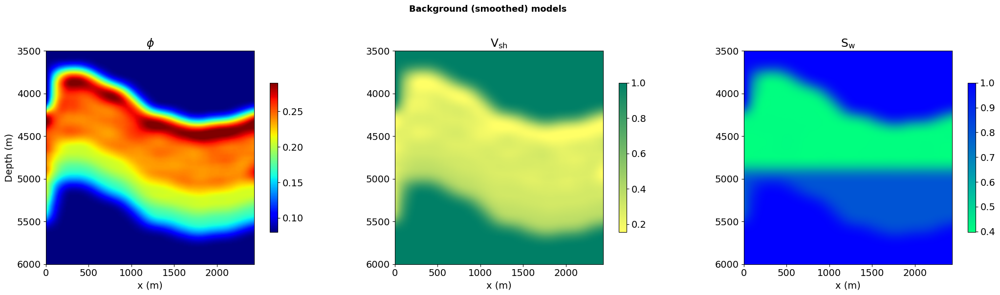

Vp range: [1852, 3139] m/s


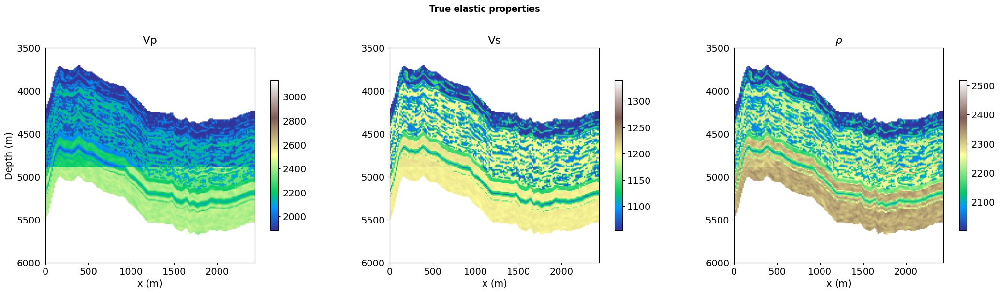

In [ ]:
# ── Background models (Gaussian-smoothed) ────────────────────────────────────
phi_2D_back, vsh_2D_back, sw_2D_back = create_background_models_synthetic(
    phi=phi_2D, vsh=vsh_2D, sw=sw_2D, nsmooth=15)

fig = plot_petrophysical_2D_sections(phi_2D_back, vsh_2D_back, sw_2D_back,
                                     x_axis, depth, fontsize=14)
plt.suptitle('Background (smoothed) models', fontsize=13, fontweight='bold', y=1.01)
plt.tight_layout(); plt.savefig('fig_petro_background.png', dpi=150, bbox_inches='tight'); plt.show()

# ── Rock physics: HM + Gassmann + Batzle-Wang ────────────────────────────────
RPM_KW = dict(pres=2.41e7, temp=50, sal=10000, oilgrav=20, gasgrav=0.9, gor=160)

vp_2D,      vs_2D,      rho_2D      = pem_seis2rock(phi_2D,      vsh_2D,      sw_2D,      **RPM_KW)
vp_2D_back, vs_2D_back, rho_2D_back = pem_seis2rock(phi_2D_back, vsh_2D_back, sw_2D_back, **RPM_KW)

print(f"Vp range: [{vp_2D.min():.0f}, {vp_2D.max():.0f}] m/s")
fig = plot_elastic_2D_sections(vp_2D, vs_2D, rho_2D, x_axis, depth, fontsize=14)
plt.suptitle('True elastic properties', fontsize=13, fontweight='bold', y=1.01)
plt.tight_layout(); plt.savefig('fig_elastic_true.png', dpi=150, bbox_inches='tight'); plt.show()

# ─── Shared inversion-quality metrics (used by Parts 1, 2.5, and 4) ─────────
def compute_metrics(true_arr, pred_arr, mask_nans=True):
    """RMSE / R² / RRE between two arrays (any shape, flattened internally).
    If mask_nans: ignore samples where pred is NaN (e.g. coord-padded sections).
    """
    t = np.asarray(true_arr).ravel()
    p = np.asarray(pred_arr).ravel()
    if mask_nans:
        m = ~np.isnan(p)
        t, p = t[m], p[m]
    rmse = float(np.sqrt(mean_squared_error(t, p)))
    r2   = float(r2_score(t, p))
    rre  = float(np.linalg.norm(t - p) / np.linalg.norm(t))
    return rmse, r2, rre

Wavelet: 41 samples, centre = 20
Depth sampling: 11.16 m/sample


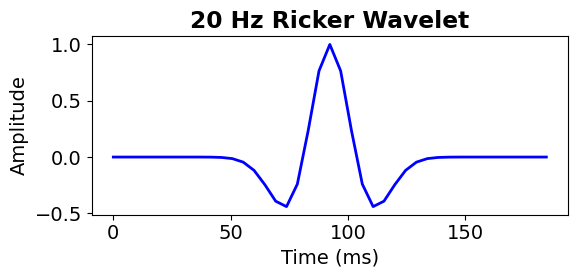

Generating AVO gathers (Zoeppritz) — takes a few minutes...
Gather shape: (174, 225, 40)  (NX, NT, NTHETA)
  ✓ No NaN/Inf in gather (max |amp| = 0.4013, 95th pct = 0.1161).


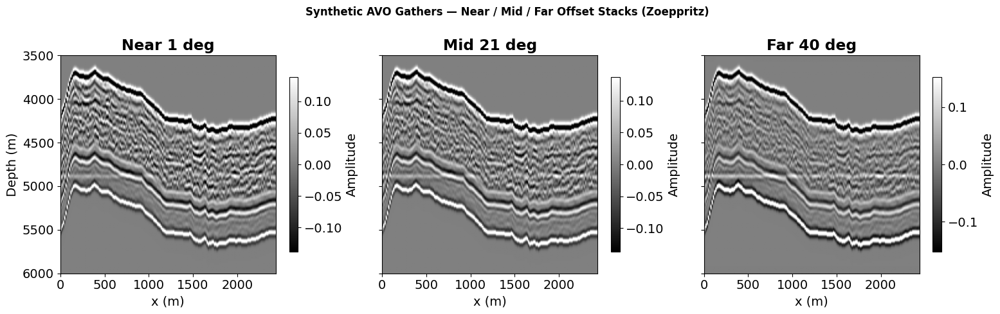

In [ ]:
# ── Wavelet (exact construction from Corrales et al. notebook) ───────────────
ntime  = depth.shape[0]                        # 225 depth samples
timeax = np.linspace(0, ntime**0.006, ntime)   # **0.006 — exact reference construction
wav, _, hcenter = ricker(timeax[:42 // 2], f0=20)
print(f"Wavelet: {len(wav)} samples, centre = {hcenter}")

# Physical sampling interval
# depth: 3500–6000 m over 225 samples → 11.16 m/sample
DT_M = (depth[-1] - depth[0]) / (ntime - 1)   # metres per depth sample ≈ 11.16 m
print(f"Depth sampling: {DT_M:.2f} m/sample")

thetamin, thetamax, ntheta = 1, 40, 40   # extended to 45° for AVO gradient discrimination (Castagna & Backus 1993)

# Plot wavelet with correct time axis
# timeax[:21] spans 0 to timeax[20]; scale to ms using dt from the time axis itself
dt_s   = timeax[1] - timeax[0]                # seconds per sample in wavelet time
wav_ms = np.arange(len(wav)) * dt_s * 1000    # ms
fig, ax = plt.subplots(figsize=(6, 3))
ax.plot(wav_ms, wav, 'b-', lw=2)
ax.set_xlabel('Time (ms)'); ax.set_ylabel('Amplitude')
ax.set_title('20 Hz Ricker Wavelet', fontweight='bold')
plt.tight_layout(); plt.savefig('fig_ricker_wavelet.png', dpi=150, bbox_inches='tight'); plt.show()

# ── Zoeppritz AVO gather synthesis ───────────────────────────────────────────
print("Generating AVO gathers (Zoeppritz) — takes a few minutes...")
d = avo_synthetic_gather_2D(
    vp=vp_2D.T, vs=vs_2D.T, rho=rho_2D.T,
    wav_est=wav, nt_wav=hcenter,
    thetamin=thetamin, thetamax=thetamax, ntheta=ntheta)
print(f"Gather shape: {d.shape}  (NX, NT, NTHETA)")

# E6 sanity check: Zoeppritz can produce NaN/Inf past the critical angle for
# high Vp contrasts. With thetamax=45° this is more likely than at 23°.
# Critical angle theta_c = arcsin(Vp1/Vp2); for Vp2/Vp1 ~ sqrt(2) (typical
# clastic-to-evaporite contrast), theta_c ~ 45°.
_n_nan = int(np.isnan(d).sum()); _n_inf = int(np.isinf(d).sum())
if _n_nan > 0 or _n_inf > 0:
    print(f"  ⚠  Zoeppritz output contains {_n_nan:,} NaN and {_n_inf:,} Inf "
          f"({100*(_n_nan+_n_inf)/d.size:.3f}% of samples).")
    print("  This typically reflects post-critical incidence at high Vp contrasts.")
    print("  Replacing with 0 to keep downstream loops finite. The CNN should "
          "learn to ignore the affected angle/depth combinations.")
    d = np.nan_to_num(d, nan=0.0, posinf=0.0, neginf=0.0)
else:
    print(f"  ✓ No NaN/Inf in gather (max |amp| = {np.abs(d).max():.4f}, "
          f"95th pct = {np.percentile(np.abs(d), 95):.4f}).")

# QC: near / mid / far partial stacks — labels derived from actual theta vector
_theta_qc_axis = np.linspace(thetamin, thetamax, ntheta)
_qc_idx = [0, ntheta // 2, ntheta - 1]
_qc_pairs = [(i, f"{['Near','Mid','Far'][k]} {_theta_qc_axis[i]:.0f} deg")
             for k, i in enumerate(_qc_idx)]
fig, axes = plt.subplots(1, 3, figsize=(16, 5), sharey=True)
for ax, (ia, label) in zip(axes, _qc_pairs):
    vm = np.percentile(np.abs(d[:,:,ia]), 97)
    im = ax.imshow(d[:,:,ia].T, cmap='gray', aspect='auto', extent=ext, vmin=-vm, vmax=vm)
    ax.set_title(label, fontweight='bold'); ax.set_xlabel('x (m)')
    plt.colorbar(im, ax=ax, shrink=0.8, label='Amplitude')
axes[0].set_ylabel('Depth (m)')
plt.suptitle('Synthetic AVO Gathers — Near / Mid / Far Offset Stacks (Zoeppritz)',
             fontsize=12, fontweight='bold')
plt.tight_layout(); plt.savefig('fig_avo_gathers_qc.png', dpi=150, bbox_inches='tight'); plt.show()

Well location: trace 100  (x = 1408 m)


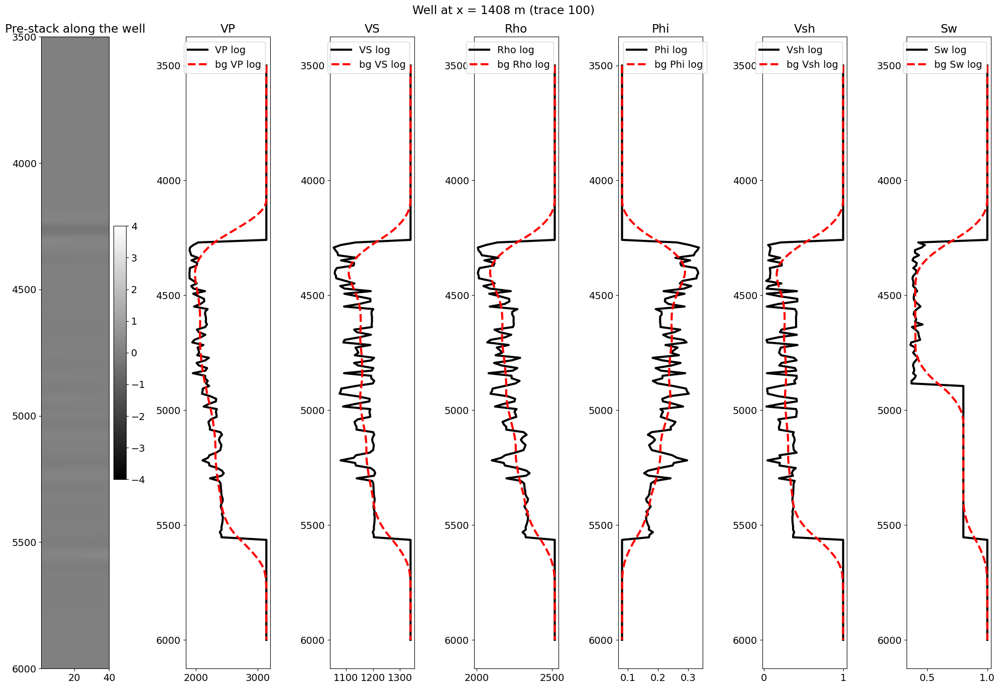

In [ ]:
# ── Well extraction (x_loc=100, x ≈ 1408 m) ─────────────────────────────────
x_loc = 100
print(f"Well location: trace {x_loc}  (x = {x_axis[x_loc]:.0f} m)")

# True elastic + petrophysical logs
vp, vs, rho, phi, vsh, sw = extract_well_logs_from_2D(
    vp_2D=vp_2D, vs_2D=vs_2D, rho_2D=rho_2D,
    phi_2D=phi_2D, vsh_2D=vsh_2D, sw_2D=sw_2D, x_loc=x_loc)

# Background logs
vp_back, vs_back, rho_back, phi_back, vsh_back, sw_back = extract_well_logs_from_2D(
    vp_2D=vp_2D_back, vs_2D=vs_2D_back, rho_2D=rho_2D_back,
    phi_2D=phi_2D_back, vsh_2D=vsh_2D_back, sw_2D=sw_2D_back, x_loc=x_loc)

# Panel: prestack gather + all six logs
plot_set_logs(
    well_name       = f'Well at x = {x_axis[x_loc]:.0f} m (trace {x_loc})',
    well_prestack   = d[x_loc, :, :],
    extent_prestack = (thetamin, thetamax, depth[-1], depth[0]),
    well_depth      = depth,
    vp=vp, vs=vs, rho=rho, phi=phi, vsh=vsh, sw=sw,
    vp_back=vp_back, vs_back=vs_back, rho_back=rho_back,
    phi_back=phi_back, vsh_back=vsh_back, sw_back=sw_back,
    figsize=(20, 14))
plt.tight_layout(); plt.savefig('fig_well_logs.png', dpi=150, bbox_inches='tight'); plt.show()

Computing AVO synthetic gathers from the well logs...
Performing SVD...
Extracting Optimal basis functions Fp..
Done! xD
5
Fp (40, 5) (NTHETA x p) — optimal basis functions


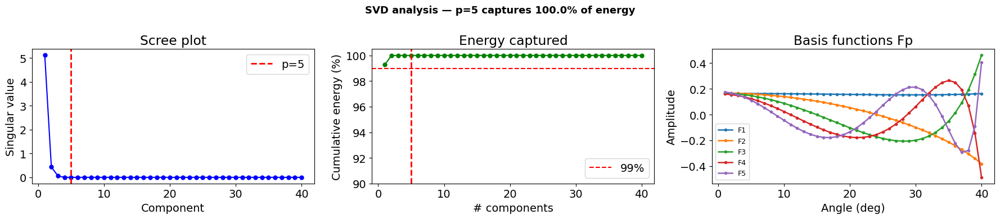

p=5 captures 100.0% of signal energy


In [ ]:
# ── SVD training (Seis2Rock) ─────────────────────────────────────────────────
p = 5   # captures > 99% of signal energy

# NOTE on namespace collisions in this cell:
#   1. Seis2Rock_training returns (Fp, Lp, Vp_svd_matrix, F_full, L_full, V_full,
#      ...). The `Vp` slot is the SVD V-matrix component, NOT the velocity log
#      `vp` from cell 8. We unpack it as `Vp_svd` to keep the two distinct.
#      (The original API uses `Vp` — fragile naming inherited from upstream.)
#   2. F (= torch.nn.functional from cell 3) was clobbered by the
#      `from pylops...import *` wildcards above. We alias the SVD return as
#      F_svd, then re-import F at the bottom of this cell.
#   3. If you re-run cells out of order in Colab, F can be clobbered again —
#      always re-run cell 3 before cells 13/14/15 if you've touched cell 9.
Fp, Lp, Vp_svd, F_svd, L_svd, V_svd, r_zoeppritz, r_zoeppritz_back, d_well = Seis2Rock_training(
    vp=vp, vs=vs, rho=rho,
    wav_est=wav, nt_wav=hcenter,
    vp_back=vp_back, vs_back=vs_back, rho_back=rho_back,
    p=p, thetamin=thetamin, thetamax=thetamax, ntheta=ntheta)

print(f"Fp {Fp.shape} (NTHETA x p) — optimal basis functions")

# Scree plot + basis functions
sv  = np.diag(np.abs(L_svd))
cum = np.cumsum(sv**2) / np.sum(sv**2) * 100
theta_axis = np.linspace(thetamin, thetamax, ntheta)

fig, axes = plt.subplots(1, 3, figsize=(18, 4))
axes[0].plot(np.arange(1,len(sv)+1), sv, 'bo-', ms=5, lw=1.5)
axes[0].axvline(p, color='r', ls='--', lw=2, label=f'p={p}')
axes[0].set_xlabel('Component'); axes[0].set_ylabel('Singular value')
axes[0].set_title('Scree plot'); axes[0].legend(); axes[0].axis('tight')

axes[1].plot(np.arange(1,len(sv)+1), cum, 'go-', ms=5, lw=1.5)
axes[1].axhline(99, color='r', ls='--', lw=1.5, label='99%')
axes[1].axvline(p, color='r', ls='--', lw=2)
axes[1].set_ylim(90, 100.5); axes[1].set_xlabel('# components')
axes[1].set_ylabel('Cumulative energy (%)'); axes[1].set_title('Energy captured')
axes[1].legend()

for i in range(p):
    axes[2].plot(theta_axis, Fp[:, i], 'o-', ms=3, lw=1.8, label=f'F{i+1}')
axes[2].set_xlabel('Angle (deg)'); axes[2].set_ylabel('Amplitude')
axes[2].set_title('Basis functions Fp'); axes[2].legend(fontsize=9)

plt.suptitle(f'SVD analysis — p={p} captures {cum[p-1]:.1f}% of energy',
             fontsize=13, fontweight='bold')
plt.tight_layout(); plt.savefig('fig_svd_analysis.png', dpi=150, bbox_inches='tight'); plt.show()
print(f"p={p} captures {cum[p-1]:.1f}% of signal energy")

# Re-import F as torch.nn.functional (PyLops wildcard imports + the SVD unpack
# both can clobber F in this namespace). This guards cells 13-15 which use F.
import torch.nn.functional as F
assert callable(getattr(F, 'mse_loss', None)), "F is not torch.nn.functional after re-import — re-run cell 3"

Computing AVO synthetic gather for background models...
Calculating matrix of optimal coefficients Cp...
Creating the new data term (Petrophysical coefficeints B)...
Done xD !
b_optAVO (3, 225, 174)  (3 properties x NT x NX)
Inverting phi ...
Inverting Vsh ...
Inverting Sw  ...
Inversion complete.


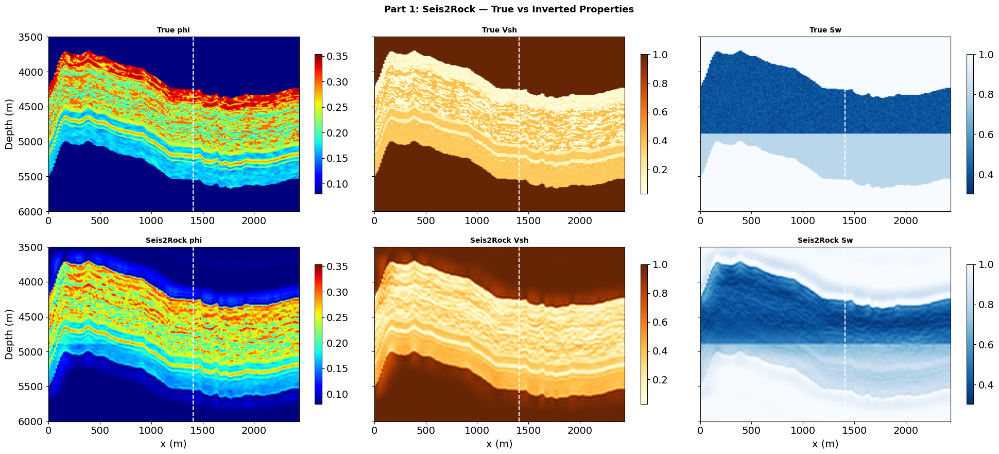

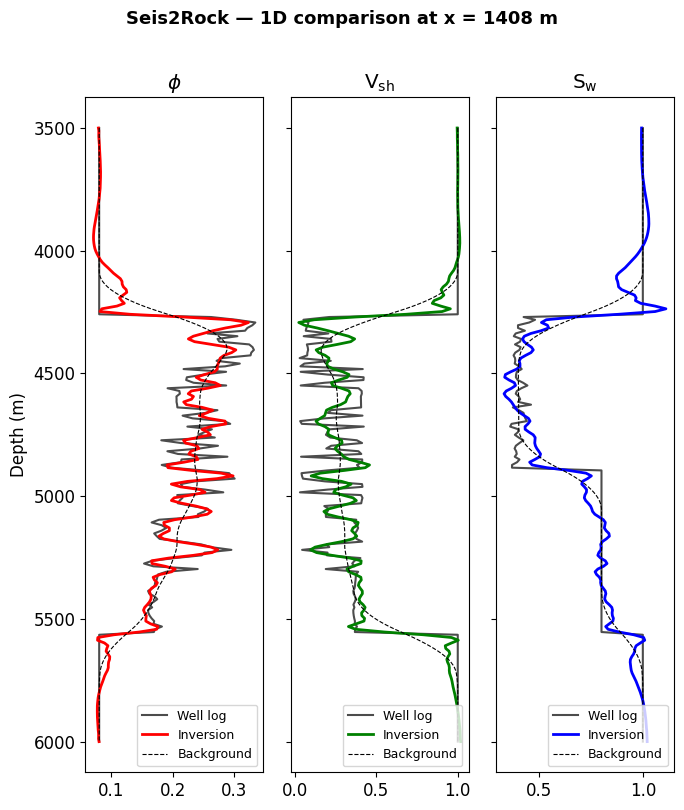

Seis2Rock phi : RMSE=0.02224  R2=0.9331  RRE=0.1231
Seis2Rock Vsh : RMSE=0.08686  R2=0.9482  RRE=0.1194
Seis2Rock Sw  : RMSE=0.06030  R2=0.9472  RRE=0.0740
Seis2Rock phi PSNR: 24.03 dB


In [ ]:
# ── Seis2Rock inference → petrophysical reflectivities ───────────────────────
b_optAVO, r_zoeppritz_back, Cp, Hp, Cp_estimated = Seis2Rock_inference(
    vp=vp_2D_back.T, vs=vs_2D_back.T, rho=rho_2D_back.T,
    wav_est=wav, nt_wav=hcenter,
    dtheta=d.transpose(0, 2, 1),   # (NX, NTHETA, NT)
    Fp=Fp, Lp=Lp, Vp=Vp_svd,    # NOTE: Vp_svd here is SVD V-matrix component (cell 9), not velocity
    phi=phi, vsh=vsh, sw=sw,
    phi_back=phi_back, vsh_back=vsh_back, sw_back=sw_back,
    d=d_well,
    thetamin=thetamin, thetamax=thetamax, ntheta=ntheta)

print(f"b_optAVO {b_optAVO.shape}  (3 properties x NT x NX)")

# ── Regularised post-stack inversion ─────────────────────────────────────────
D_op = PoststackLinearModelling(wav, nt0=b_optAVO.shape[1],
                                spatdims=b_optAVO.shape[2], explicit=True, kind='forward')
D2op = Laplacian([b_optAVO.shape[1], b_optAVO.shape[2]], dtype='float64')

niter  = 50
lamba1 = np.sqrt(1e-2); damp1 = 10e-2
lamba2 = np.sqrt(1e-1); damp2 = 1e-2

def invert(b, x0, lamba, damp):
    return regularized_inversion(
        D_op, b.ravel(), Regs=[D2op], epsRs=[lamba],
        x0=x0.ravel(), **dict(iter_lim=niter, damp=damp))[0].reshape(x0.shape)

print("Inverting phi ..."); phi_s2r = invert(b_optAVO[0], phi_2D_back, lamba1, damp1)
print("Inverting Vsh ..."); vsh_s2r = invert(b_optAVO[1], vsh_2D_back, lamba2, damp2)
print("Inverting Sw  ..."); sw_s2r  = invert(b_optAVO[2], sw_2D_back,  lamba2, damp2)
print("Inversion complete.")

# ── Results figure: True vs Seis2Rock for all three properties ────────────────
fig, axes = plt.subplots(2, 3, figsize=(20, 9), sharey=True)
for col, (true, pred, lbl, cm) in enumerate([
        (phi_2D, phi_s2r, 'phi',  'jet'),
        (vsh_2D, vsh_s2r, 'Vsh',  'YlOrBr'),
        (sw_2D,  sw_s2r,  'Sw',   'Blues_r')]):
    for row, (data, rtag) in enumerate([(true, 'True'), (pred, 'Seis2Rock')]):
        ax = axes[row, col]
        v0, v1 = true.min(), true.max()
        im = ax.imshow(data, aspect='auto', cmap=cm, extent=ext, vmin=v0, vmax=v1)
        ax.axvline(x_axis[x_loc], color='white', lw=1.5, ls='--')
        ax.set_title(f'{rtag} {lbl}', fontweight='bold', fontsize=10)
        if col == 0: ax.set_ylabel('Depth (m)')
        if row == 1: ax.set_xlabel('x (m)')
        plt.colorbar(im, ax=ax, shrink=0.8)
plt.suptitle('Part 1: Seis2Rock — True vs Inverted Properties',
             fontsize=13, fontweight='bold')
plt.tight_layout()
plt.savefig('fig_seis2rock_results.png', dpi=150, bbox_inches='tight'); plt.show()

# ── 1D well comparison ────────────────────────────────────────────────────────
fig = plot_well_results_2Dsynthethic(
    depth=depth,
    well_logs     = [phi, vsh, sw],
    inv_dense_reg = [phi_s2r, vsh_s2r, sw_s2r],
    backgrounds   = [phi_back, vsh_back, sw_back],
    x_loc=x_loc)
plt.suptitle(f'Seis2Rock — 1D comparison at x = {x_axis[x_loc]:.0f} m',
             fontsize=13, fontweight='bold', y=1.01)
plt.tight_layout()
plt.savefig('fig_seis2rock_well.png', dpi=150, bbox_inches='tight'); plt.show()

# ── Metrics — all three properties ───────────────────────────────────────────
def _s2r_metrics(true2d, pred2d, name):
    rmse, r2, rre = compute_metrics(true2d, pred2d, mask_nans=True)
    print(f"Seis2Rock {name:<4}: RMSE={rmse:.5f}  R2={r2:.4f}  RRE={rre:.4f}")
    return rmse, r2, rre

s2r_phi_rmse_full, s2r_phi_r2_full, s2r_phi_rre_full = _s2r_metrics(phi_2D, phi_s2r, "phi")
s2r_vsh_rmse,      s2r_vsh_r2,      s2r_vsh_rre      = _s2r_metrics(vsh_2D, vsh_s2r, "Vsh")
s2r_sw_rmse,       s2r_sw_r2,       s2r_sw_rre       = _s2r_metrics(sw_2D,  sw_s2r,  "Sw")
# PSNR retained for phi (used historically as the inversion-quality benchmark
# in Corrales et al. 2024, Table 1)
_mse_phi = mean_squared_error(phi_2D.ravel(), phi_s2r.ravel())
print(f"Seis2Rock phi PSNR: {10 * np.log10(phi_2D.max()**2 / _mse_phi):.2f} dB")


## Part 2 — RWPGNNDirect 2D CNN Multi-Output Inversion

Raw AVO patches (45 angles x 41 depth samples) → shared 2D CNN encoder →
three simultaneous outputs (phi, Vsh, Sw).

The physics-informed loss compares observed and synthetic multi-angle gathers
(5 angles spanning 1°–45°) through a differentiable rock-physics decoder:
**Hertz-Mindlin → Gassmann → Shuey (1985) 3-term reflectivity → wavelet
convolution**. All three petrophysical properties propagate through the
decoder, so the physics term provides gradients to all three heads at every
training trace — not only at well locations.

Cell 15 trains with 1 well; cell 18 with 2 wells; the well-count sweep in
Part 2.5 (cell 20) covers N ∈ {1, 2, 4, 8, 16, 100}, where N=100 is included as an upper-bound diagnostic under near-full supervision.


In [ ]:
# ── Part 2 Cell 1: AVO patches with leak-proof trace-based split ─────────────
HALF_WIN = 20
WIN      = 2 * HALF_WIN + 1   # 41 depth samples
NTHETA   = ntheta              # 45 angles

coords = [(i, j) for j in range(NX) for i in range(HALF_WIN, NT - HALF_WIN)]
N      = len(coords)

# Vectorised patch construction via stride tricks (E4 fix)
# d.shape = (NX, NT, NTHETA); we want windows of WIN samples in axis-1 (depth).
# sliding_window_view returns shape (NX, NT-WIN+1, NTHETA, WIN); valid centre
# depths are HALF_WIN .. NT-HALF_WIN-1, which corresponds to window index
# 0 .. NT-2*HALF_WIN-1, i.e. all of them.
from numpy.lib.stride_tricks import sliding_window_view
_d_windows = sliding_window_view(d, window_shape=WIN, axis=1)  # (NX, NT-WIN+1, NTHETA, WIN)
# coords iteration order is for j in NX: for i in HALF_WIN..NT-HALF_WIN ;
# window centre at i corresponds to window index (i - HALF_WIN).
X_avo = _d_windows.transpose(0, 1, 2, 3).reshape(NX * (NT - WIN + 1), NTHETA, WIN)
X_avo = np.ascontiguousarray(X_avo, dtype=np.float32)        # (N, NTHETA, WIN)

# Targets at each (i, j) centre
i_centres = np.arange(HALF_WIN, NT - HALF_WIN)
j_traces  = np.arange(NX)
JJ, II    = np.meshgrid(j_traces, i_centres, indexing='ij')   # (NX, len(i_centres))
Y_all = np.stack([phi_2D[II, JJ], vsh_2D[II, JJ], sw_2D[II, JJ]], axis=-1)
Y_all = Y_all.reshape(-1, 3).astype(np.float32)                # (N, 3)

assert X_avo.shape == (N, NTHETA, WIN) and Y_all.shape == (N, 3), \
    f"Patch shape mismatch: X_avo={X_avo.shape}, Y_all={Y_all.shape}, expected N={N}"

# Z-score normalise inputs per angle channel
X_mu    = X_avo.mean(axis=(0,2), keepdims=True)
X_std   = X_avo.std(axis=(0,2),  keepdims=True) + 1e-8
X_avo_n = ((X_avo - X_mu) / X_std).astype(np.float32)

# Min-max normalise targets to [0,1]
y_min = Y_all.min(axis=0)
y_max = Y_all.max(axis=0)
Y_n   = ((Y_all - y_min) / (y_max - y_min + 1e-8)).astype(np.float32)
denorm_all = lambda yn: yn * (y_max - y_min) + y_min

# ── Trace-based split — prevents data leakage ─────────────────────────────────
# Both well traces must be in training regardless of experiment.
# x_loc=100 and x_loc2=51 are both discarded from test_traces_set.
# NOTE: x_loc2=51 is chosen (not 50) because 50 is in range(0,NX,5) and
#       would be a test trace. 51 % 5 != 0, so it is always in training.
x_loc2 = 51   # second virtual well at x ≈ 714 m (not divisible by 5)

test_traces_set = set(range(0, NX, 5))
test_traces_set.discard(x_loc)    # well 1 always in training
test_traces_set.discard(x_loc2)   # well 2 always in training (even if unused)

trace_of   = np.array([j for i, j in coords])
train_mask = ~np.isin(trace_of, list(test_traces_set))
test_mask  =  np.isin(trace_of, list(test_traces_set))

# QC — confirm zero leakage and both well traces are in training
assert len(set(trace_of[train_mask]) & set(trace_of[test_mask])) == 0, "Leakage!"
assert x_loc  not in test_traces_set, "Well 1 in test set!"
assert x_loc2 not in test_traces_set, "Well 2 in test set!"
n_well_patches = int((trace_of == x_loc).sum())
print(f"Patches: {N:,}  train={train_mask.sum():,}  test={test_mask.sum():,}  well={n_well_patches:,}")
print(f"x_loc={x_loc} (x={x_axis[x_loc]:.0f} m)  x_loc2={x_loc2} (x={x_axis[x_loc2]:.0f} m)")
print(f"Both well traces confirmed in training set.")

# ── Multi-angle observed gather for 3-parameter PGNN (5 evenly-spaced angles)
# Used by Shuey 3-term decoder in cells 13-15 / 20.
# For NTHETA=45 over thetamin–thetamax = 1°–45°, indices [0, 11, 22, 33, 44]
# → angles ≈ [1, 12, 23, 34, 45]°.
ANGLE_IDX = np.linspace(0, NTHETA - 1, 5).astype(int)
THETA_AXIS_DEG = np.linspace(thetamin, thetamax, NTHETA)
THETA_SUBSET_DEG = THETA_AXIS_DEG[ANGLE_IDX]
print(f"PGNN angle subset (deg): {THETA_SUBSET_DEG.round(2).tolist()}")
# Shuey-vs-Zoeppritz mismatch grows past ~30°; the network must learn to
# absorb this discrepancy in Ls (Mahob & Castagna 2003, Geophysics 68(5)).
if THETA_SUBSET_DEG.max() >= 30:
    print(f"  Far angle = {THETA_SUBSET_DEG.max():.1f}° — gives Shuey curvature term "
          f"(tan²θ − sin²θ) leverage on far-angle response, helps Sw/density discrimination.")

# Vectorised — extract the 5-angle subset directly from the windowed view
# _d_windows shape: (NX, NT-WIN+1, NTHETA, WIN)
Y_gather = _d_windows[:, :, ANGLE_IDX, :].reshape(NX * (NT - WIN + 1), len(ANGLE_IDX), WIN)
Y_gather = np.ascontiguousarray(Y_gather, dtype=np.float32)
assert Y_gather.shape == (N, len(ANGLE_IDX), WIN), \
    f"Y_gather shape mismatch: {Y_gather.shape}, expected ({N}, {len(ANGLE_IDX)}, {WIN})"
print(f"Y_gather shape: {Y_gather.shape}  (N, {len(ANGLE_IDX)}_angles, WIN)")
del _d_windows   # free intermediate

# ─── Shared denormalisation helpers (R5) ────────────────────────────────────
# `denorm_all` (lambda above) maps (N, 3)-norm → (N, 3)-physical for all 3 props.
# `denorm_one(idx)` is the per-property variant used in cells 14, 17, 20, 26.
def denorm_one(yn, k):
    """De-normalise the k-th petrophysical property only (k in {0:phi, 1:Vsh, 2:Sw})."""
    return yn * (y_max[k] - y_min[k]) + y_min[k]

# ─── Cached True-section colour ranges (R7) ─────────────────────────────────
PHI_VMIN, PHI_VMAX = float(phi_2D.min()), float(phi_2D.max())
VSH_VMIN, VSH_VMAX = float(vsh_2D.min()), float(vsh_2D.max())
SW_VMIN,  SW_VMAX  = float(sw_2D.min()),  float(sw_2D.max())

# ─── One-shot GPU upload of training/test tensors (R4) ──────────────────────
# Avoids re-uploading the same arrays in cells 15, 20, 25 (saves H2D bandwidth
# at the cost of holding ~30 MB on GPU permanently — fine for T4, 16 GB).
# These are used by:
#   - cell 15  (train_RWPGNN)
#   - cell 20  (train_RWPGNN_fast — already used these names; keep them stable)
#   - cell 25  (train_dm)
X_tr_gpu = torch.tensor(X_avo_n[train_mask]).to(DEVICE)
Y_tr_gpu = torch.tensor(Y_n[train_mask]).to(DEVICE)
G_tr_gpu = torch.tensor(Y_gather[train_mask]).to(DEVICE)   # (N_tr, 5, WIN)
X_te_gpu = torch.tensor(X_avo_n[test_mask]).to(DEVICE)
Y_te_gpu = torch.tensor(Y_n[test_mask]).to(DEVICE)
y_min_t  = torch.tensor(y_min, dtype=torch.float32, device=DEVICE)
y_max_t  = torch.tensor(y_max, dtype=torch.float32, device=DEVICE)
theta_rad_PGNN = torch.tensor(np.deg2rad(THETA_SUBSET_DEG), dtype=torch.float32, device=DEVICE)
print(f"GPU tensors hoisted: X_tr_gpu {tuple(X_tr_gpu.shape)}, Y_tr_gpu {tuple(Y_tr_gpu.shape)}, "
      f"G_tr_gpu {tuple(G_tr_gpu.shape)}")



Patches: 32,190  train=25,900  test=6,290  well=185
x_loc=100 (x=1408 m)  x_loc2=51 (x=718 m)
Both well traces confirmed in training set.
PINN angle subset (deg): [1.0, 10.0, 20.0, 30.0, 40.0]
  Far angle = 40.0° — gives Shuey curvature term (tan²θ − sin²θ) leverage on far-angle response, helps Sw/density discrimination.
Y_gather shape: (32190, 5, 41)  (N, 5_angles, WIN)
GPU tensors hoisted: X_tr_gpu (25900, 40, 41), Y_tr_gpu (25900, 3), G_tr_gpu (25900, 5, 41)


In [ ]:
# ── Part 2 Cell 2: RWPGNN architecture + 3-parameter HM+Gassmann decoder ────

class RWPGNN(nn.Module):
    """
    2D CNN: AVO patch (NTHETA x WIN) -> (phi, Vsh, Sw) simultaneously.
    Shared encoder forces physically consistent multi-property predictions.
    """
    def __init__(self, ntheta, win):
        super().__init__()
        self.enc = nn.Sequential(
            nn.Conv2d(1, 16, (3,7), padding=(1,3)), nn.ReLU(), nn.BatchNorm2d(16),
            nn.Conv2d(16, 32, (3,5), padding=(1,2)), nn.ReLU(), nn.BatchNorm2d(32),
            nn.MaxPool2d((1,2)),
            nn.Conv2d(32, 32, (max(1,ntheta//4),3), padding=(0,1)),
            nn.ReLU(), nn.BatchNorm2d(32),
            nn.AdaptiveAvgPool2d((1,1)))
        self.drop = nn.Dropout(0.30)
        def head():
            return nn.Sequential(nn.Linear(32,16), nn.ReLU(), nn.Linear(16,1), nn.Sigmoid())
        self.h_phi = head(); self.h_vsh = head(); self.h_sw = head()

    def forward(self, x):
        f = self.drop(self.enc(x.unsqueeze(1)).flatten(1))
        return torch.cat([self.h_phi(f), self.h_vsh(f), self.h_sw(f)], dim=1)


class HMGassmannDecoder(nn.Module):
    """
    Differentiable Hertz-Mindlin + Gassmann + Shuey 3-term + wavelet
    forward model for SIMULTANEOUS (phi, Vsh, Sw) inversion.

    forward(phi, vsh, sw, theta_rad) -> (B, N_angles, WIN) synthetic gather.

    All three inputs propagate through the rock-physics chain:
      phi, Vsh -> VRH mineral mix -> HM dry frame (Kd, mu_d)
      Sw       -> Reuss fluid mix (Kfl, rho_fl)
      Gassmann -> Ks (saturated bulk); mu_sat = mu_d (Gassmann assumption)
      Vp = sqrt((Ks + 4/3 mu_d)/rho),  Vs = sqrt(mu_d/rho)
      Shuey (1985) 3-term reflectivity per angle, Form A:
          R(theta) = A + B sin^2(theta) + C (tan^2(theta) - sin^2(theta))
      Convolution with wavelet -> synthetic gather

    NOTE: Shuey is a Vp/Vs/rho-contrast linearisation. The forward modelling
    of the *data* uses full Zoeppritz (cell 7); the decoder uses Shuey. This
    is a deliberate forward-model mismatch in the loss for theta > ~30°
    (Mahob & Castagna 2003, Geophysics 68(5)). Ls will not converge to zero.

    Frozen during training — provides physics gradients to all three heads.
    """
    def __init__(self, wav_np,
                 K_sand=37.6e9,  mu_sand=44.6e9,  rho_sand=2650.,
                 K_shale=20.9e9, mu_shale=30.6e9, rho_shale=2580.,
                 coord_number=8.0, pressure=24.1e6,
                 K_brine=2.68e9, rho_brine=1050.,
                 K_oil=1.05e9,   rho_oil=800.,
                 phi_c=0.40):
        super().__init__()
        for name, val in [
                ('K_sand',K_sand),('mu_sand',mu_sand),('rho_sand',rho_sand),
                ('K_shale',K_shale),('mu_shale',mu_shale),('rho_shale',rho_shale),
                ('C',coord_number),('P',pressure),
                ('K_brine',K_brine),('rho_brine',rho_brine),
                ('K_oil',K_oil),('rho_oil',rho_oil),
                ('phi_c',phi_c)]:
            self.register_buffer(name, torch.tensor(float(val)))
        w = torch.tensor(wav_np, dtype=torch.float32)
        self.register_buffer('wk', w.flip(0).reshape(1,1,-1))
        self.wp   = len(wav_np) // 2
        self._pi2 = float(np.pi**2)

    def _rock_physics(self, phi, vsh, sw):
        """Returns Vp, Vs, rho — each shape (B, 1, WIN). Differentiable in all 3 inputs."""
        phi = torch.clamp(phi, 0.005, self.phi_c - 0.005)
        vsh = torch.clamp(vsh, 0.0,   1.0)
        sw  = torch.clamp(sw,  0.0,   1.0)
        # VRH mineral mixing (depends on Vsh)
        Kv = (1-vsh)*self.K_sand  + vsh*self.K_shale
        Kr = 1.0/((1-vsh)/self.K_sand  + vsh/self.K_shale + 1e-20)
        mv = (1-vsh)*self.mu_sand + vsh*self.mu_shale
        mr = 1.0/((1-vsh)/self.mu_sand + vsh/self.mu_shale + 1e-20)
        Km = 0.5*(Kv+Kr);  mm = 0.5*(mv+mr)
        rm = (1-vsh)*self.rho_sand + vsh*self.rho_shale
        nu = (3*Km-2*mm)/(6*Km+2*mm+1e-10)
        # Hertz-Mindlin dry frame (depends on phi, Vsh via mm, nu)
        tK  = (self.C**2*(1-phi)**2*mm**2*self.P)/(18*self._pi2*(1-nu**2)+1e-10)
        Kd  = torch.pow(torch.clamp(tK,min=1e-10), 1./3.)
        pf  = (5-4*nu)/(5*(2-nu)+1e-10)
        tmu = (3*self.C**2*(1-phi)**2*mm**2*self.P)/(2*self._pi2*(1-nu**2)+1e-10)
        md  = pf*torch.pow(torch.clamp(tmu,min=1e-10), 1./3.)
        # Fluid + Gassmann (depends on Sw, phi, Vsh)
        Kfl = 1.0/(sw/self.K_brine + (1-sw)/self.K_oil + 1e-10)
        rfl = sw*self.rho_brine + (1-sw)*self.rho_oil
        num = (1-Kd/(Km+1e-10))**2
        den = phi/(Kfl+1e-10) + (1-phi)/(Km+1e-10) - Kd/(Km**2+1e-10)
        Ks  = Kd + num/(den+1e-10)
        rho = rm*(1-phi) + rfl*phi
        vp  = torch.sqrt((Ks + 4./3.*md)/(rho+1e-10))
        vs  = torch.sqrt(md/(rho+1e-10))
        return vp, vs, rho

    @staticmethod
    def _shuey_3term(vp, vs, rho, theta_rad):
        """
        Shuey (1985) 3-term linearised reflectivity, Form A:
            R(theta) = A + B sin^2(theta) + C (tan^2(theta) - sin^2(theta))
        with
            A = 0.5*(dVp/Vp + drho/rho)                       (intercept)
            B = 0.5*dVp/Vp - 4 (Vs/Vp)^2 dVs/Vs
                            - 2 (Vs/Vp)^2 drho/rho            (gradient)
            C = 0.5*dVp/Vp                                    (curvature/far-angle)

        References:
          Shuey (1985), Geophysics 50(4), 609-614.
          Castagna & Backus (1993), Offset-Dependent Reflectivity, SEG, ch. 1.
          Avseth, Mukerji & Mavko (2005), Quantitative Seismic Interpretation,
            CUP, eq. 4.34.

        vp, vs, rho : (B, 1, WIN). theta_rad : (N_angles,) tensor.
        Returns rc : (B, N_angles, WIN).
        """
        def avg_diff(x):
            x_avg = 0.5 * (x[:, :, 1:] + x[:, :, :-1])
            x_dif = x[:, :, 1:] - x[:, :, :-1]
            return x_avg, x_dif
        vp_a, dvp = avg_diff(vp)
        vs_a, dvs = avg_diff(vs)
        rho_a, drho = avg_diff(rho)
        ratio2 = (vs_a / (vp_a + 1e-10))**2                       # (B,1,WIN-1)
        # Per-interface relative contrasts
        rvp  = dvp / (vp_a  + 1e-10)
        rvs  = dvs / (vs_a  + 1e-10)
        rrho = drho/ (rho_a + 1e-10)
        # Shuey Form A coefficients
        A_co = 0.5 * (rvp + rrho)                                 # (B,1,WIN-1)
        B_co = 0.5 * rvp - 4.0 * ratio2 * rvs - 2.0 * ratio2 * rrho
        C_co = 0.5 * rvp
        # Angle factors: shape (1, N_angles, 1)
        s2 = torch.sin(theta_rad).reshape(1, -1, 1)**2
        t2 = torch.tan(theta_rad).reshape(1, -1, 1)**2
        # Reflectivity per angle
        rc = A_co + B_co * s2 + C_co * (t2 - s2)                  # (B, N_angles, WIN-1)
        rc = F.pad(rc, (1, 0))                                    # pad to WIN
        return rc

    def forward(self, phi, vsh, sw, theta_rad):
        """
        phi, vsh, sw : (B, 1, WIN). theta_rad : (N_angles,) tensor on same device.
        Returns synthetic gather (B, N_angles, WIN).
        """
        vp, vs, rho = self._rock_physics(phi, vsh, sw)
        rc = self._shuey_3term(vp, vs, rho, theta_rad)             # (B, N_ang, WIN)
        # Convolve each angle channel independently with the wavelet
        B, Na, W = rc.shape
        rc_flat = rc.reshape(B * Na, 1, W)
        syn = F.conv1d(F.pad(rc_flat, (self.wp, self.wp)), self.wk)
        syn = syn[:, :, :W].reshape(B, Na, W)
        return syn

# ── Gradient check: all three inputs must produce non-zero gradients ─────────
_phi  = torch.full((2, 1, 41), 0.20, requires_grad=True)
_vsh  = torch.full((2, 1, 41), 0.30, requires_grad=True)
_sw   = torch.full((2, 1, 41), 0.80, requires_grad=True)
# Inject a vertical perturbation so reflectivity is non-trivial
_phi_t = _phi.clone().detach().requires_grad_(True)
_vsh_t = _vsh.clone().detach().requires_grad_(True)
_sw_t  = _sw.clone().detach().requires_grad_(True)
with torch.no_grad():
    _phi_t[:, :, 20:] = 0.25
    _vsh_t[:, :, 20:] = 0.40
    _sw_t[:,  :, 20:] = 0.60
_phi_t.requires_grad_(True); _vsh_t.requires_grad_(True); _sw_t.requires_grad_(True)
_d = HMGassmannDecoder(wav.astype(np.float32))
_theta = torch.tensor(np.deg2rad(THETA_SUBSET_DEG), dtype=torch.float32)
_out = _d(_phi_t, _vsh_t, _sw_t, _theta)
assert _out.shape == (2, len(THETA_SUBSET_DEG), 41), f"Bad shape {_out.shape}"
_out.sum().backward()
for name, t in [('phi', _phi_t), ('vsh', _vsh_t), ('sw', _sw_t)]:
    g = t.grad
    assert g is not None and not torch.all(g == 0), f"Gradient flow FAILED for {name}"
print("HMGassmannDecoder: gradient flow verified for phi, Vsh, Sw.")
print(f"  Output shape: (B=2, N_angles={len(THETA_SUBSET_DEG)}, WIN=41) ✓")
n_params = sum(p.numel() for p in RWPGNN(NTHETA,WIN).parameters())
print(f"RWPGNN parameters: {n_params:,}")
del _phi, _vsh, _sw, _phi_t, _vsh_t, _sw_t, _d, _out, _theta

# ─── S8: torch.compile helper. PyTorch ≥ 2.0 only; falls back to plain model otherwise.
# `mode='default'` is shape-insensitive (last batch in an epoch is smaller than BATCH).
# We compile only the RWPGNN, not the rock-physics decoder (the decoder is small
# enough that compile overhead dominates; also it has fp32-sensitive epsilons).
def _maybe_compile(model):
    try:
        if hasattr(torch, 'compile') and DEVICE.type == 'cuda':
            return torch.compile(model, mode='default', fullgraph=False)
    except Exception as e:
        print(f"  (torch.compile unavailable, skipping: {e})")
    return model



HMGassmannDecoder: gradient flow verified for phi, Vsh, Sw.
  Output shape: (B=2, N_angles=5, WIN=41) ✓
RWPGNN parameters: 40,611


In [ ]:
# ── Part 2 Cell 3: 3-parameter physics-informed loss ────────────────────────
def PGNN_loss_hmg(preds, true, seis_obs_gather, decoder, theta_rad, well_mask_b,
                  lam_phi=1.0, lam_vsh=0.3, lam_sw=0.3,
                  beta=0.35, gamma=0.03,
                  y_min_t=None, y_max_t=None):
    """
    L = (lam_phi*Lw_phi + lam_vsh*Lw_vsh + lam_sw*Lw_sw)
        + beta*Ls + gamma*Lr

    Lw_*: supervised MSE per property at well samples (anchor from known geology)
    Ls  : seismic consistency — 3-parameter HM+Gassmann+Shuey-3-term forward model
          of predicted (phi, Vsh, Sw) vs observed multi-angle gather.
          Self-supervised at all training traces.
    Lr  : depth-direction smoothness regulariser on phi (high-frequency damping)

    Vsh and Sw supervised terms are down-weighted (0.3) because:
      - Sw remains the worst-conditioned of the three even at theta_max=45deg:
        AVO gradient discriminates fluid from lithology, but the Vp/Vs ratio
        ambiguity persists (Goodway 2001, CSEG Recorder; Avseth et al. 2005).
      - The Ls term provides physics gradients to Vsh and Sw at every training
        patch, but the magnitude is small for these heads (sanity-check 4 of
        the loss unit test: Ls grad to Vsh/Sw is ~10^4× smaller than to phi),
        so well supervision still does most of the learning. Down-weighting
        prevents over-fitting the well log without losing physical anchoring.

    preds, true     : (B, 3) — normalised [phi, Vsh, Sw]
    seis_obs_gather : (B, N_angles, WIN)
    decoder         : frozen HMGassmannDecoder (3-input)
    theta_rad       : (N_angles,) tensor
    well_mask_b     : (B,) bool — True for patches from training wells
    y_min_t, y_max_t: (3,) tensors for de-normalising preds before physics
    """
    phi_p_n, vsh_p_n, sw_p_n = preds[:, 0], preds[:, 1], preds[:, 2]

    # ── Lw: supervised well loss, per-property weighted ──────────────────────
    if well_mask_b.any():
        lw_phi = F.mse_loss(phi_p_n[well_mask_b], true[well_mask_b, 0])
        lw_vsh = F.mse_loss(vsh_p_n[well_mask_b], true[well_mask_b, 1])
        lw_sw  = F.mse_loss(sw_p_n[well_mask_b],  true[well_mask_b, 2])
    else:
        # No well patches in this batch — skip supervised term (zero-grad)
        # rather than silently switching objectives. This is a deliberate fix:
        # in v1 the fallback was "MSE on whole batch" which is wrong.
        z = torch.tensor(0., device=preds.device)
        lw_phi = lw_vsh = lw_sw = z
    lw = lam_phi*lw_phi + lam_vsh*lw_vsh + lam_sw*lw_sw

    # ── Ls: seismic consistency on multi-angle gather ────────────────────────
    # De-normalise predictions to physical units before the rock-physics decoder
    if y_min_t is not None and y_max_t is not None:
        phi_phys = phi_p_n * (y_max_t[0] - y_min_t[0]) + y_min_t[0]
        vsh_phys = vsh_p_n * (y_max_t[1] - y_min_t[1]) + y_min_t[1]
        sw_phys  = sw_p_n  * (y_max_t[2] - y_min_t[2]) + y_min_t[2]
    else:
        phi_phys, vsh_phys, sw_phys = phi_p_n, vsh_p_n, sw_p_n

    # Expand scalar predictions to constant patches of shape (B, 1, WIN).
    # NOTE: this is a LOCALLY-CONSTANT approximation — each patch sees one
    # value per property. The reflectivity is therefore zero everywhere in
    # the patch, which makes Ls an amplitude-bias term rather than a full
    # waveform fit. This is a known limitation; a depth-varying decoder
    # would require sequence outputs from the network. Flagged for future work.
    WIN_local = seis_obs_gather.shape[-1]
    phi_win = phi_phys.unsqueeze(1).unsqueeze(2).expand(-1, 1, WIN_local)
    vsh_win = vsh_phys.unsqueeze(1).unsqueeze(2).expand(-1, 1, WIN_local)
    sw_win  = sw_phys.unsqueeze(1).unsqueeze(2).expand(-1, 1, WIN_local)
    syn = decoder(phi_win, vsh_win, sw_win, theta_rad)   # (B, N_ang, WIN)
    # Normalise per-trace per-angle by trace variance so high-amplitude
    # angles do not dominate
    var = seis_obs_gather.var(dim=-1, keepdim=True) + 1e-8
    ls  = torch.mean((seis_obs_gather - syn)**2 / var)

    # ── Lr: depth smoothness on phi ──────────────────────────────────────────
    if len(phi_p_n) > 1:
        lr = torch.mean((phi_p_n[1:] - phi_p_n[:-1])**2)
    else:
        lr = torch.tensor(0., device=preds.device)

    total = lw + beta * ls + gamma * lr
    return total, {'Lw_phi': lw_phi.item(), 'Lw_vsh': lw_vsh.item(),
                   'Lw_sw':  lw_sw.item(),  'Ls': ls.item(),
                   'Lr': lr.item(),
                   'Lt': total.item()}


In [ ]:
# ── Part 2 Cell 4: Training with early stopping (3-parameter PGNN) ──────────
# S2: BATCH 128→512 (T4 has plenty of memory for the small RWPGNN inputs).
# S5: PATIENCE = 50 with ReduceLROnPlateau; the scheduler handles plateaus while patience guards against true non-improvement.
# LR warmup over WARMUP_EPOCHS smooths the initial larger-batch step (Goyal et al. 2017).
EPOCHS  = 150; BATCH = 512; LR = 1e-3; PATIENCE = 50; WARMUP_EPOCHS = 5

def train_RWPGNN(well_idx_list=None):
    """
    Train RWPGNN for SIMULTANEOUS (phi, Vsh, Sw) inversion.
    Physics-informed PGNN seismic loss uses the 3-parameter Shuey-3-term
    decoder over a 5-angle gather (1°-45°), providing physics gradients to
    all three heads at every training trace (not just porosity).

    Both well traces (x_loc, x_loc2) are always in train_mask (cell 12).
    """
    if well_idx_list is None:
        well_idx_list = [x_loc]

    Wmask_train = torch.tensor(
        np.isin(trace_of[train_mask], well_idx_list),
        dtype=torch.bool).to(DEVICE)

    # Reuse hoisted GPU tensors from cell 12 (R4 fix: no re-upload)
    X_te, Y_te = X_te_gpu, Y_te_gpu
    Xall, Yall = X_tr_gpu, Y_tr_gpu
    Gall       = G_tr_gpu
    theta_rad  = theta_rad_PGNN

    torch.manual_seed(42)
    model = RWPGNN(NTHETA, WIN).to(DEVICE)
    model = _maybe_compile(model)                         # S8: torch.compile on GPU
    dec   = HMGassmannDecoder(wav.astype(np.float32)).to(DEVICE)
    for pp in dec.parameters():
        pp.requires_grad = False

    opt = torch.optim.Adam(model.parameters(), lr=LR, weight_decay=1e-4)
    sch = torch.optim.lr_scheduler.ReduceLROnPlateau(opt, patience=5, factor=0.5)
    n_train = len(Yall); n_batches = (n_train + BATCH - 1) // BATCH

    # S1: GradScaler for AMP on CUDA. On CPU/MPS, falls back to identity scaler.
    _amp_dtype = torch.float16 if DEVICE.type == 'cuda' else torch.bfloat16
    _use_amp   = (DEVICE.type == 'cuda')   # AMP only meaningfully helps on GPU
    scaler     = torch.amp.GradScaler('cuda', enabled=_use_amp)

    best_val = float('inf'); best_st = None; pat = 0
    hist = {'train': [], 'train_sup': [], 'train_sup_ep': [], 'val': [],
            'phi': [], 'vsh': [], 'sw': []}
    TRAIN_SUP_EVERY = 5

    for ep in range(EPOCHS):
        # S2: linear LR warmup for first WARMUP_EPOCHS to stabilise the large-batch start
        if ep < WARMUP_EPOCHS:
            warm_lr = LR * (ep + 1) / WARMUP_EPOCHS
            for pg in opt.param_groups:
                pg['lr'] = warm_lr

        model.train(); ep_loss = 0.0
        perm = torch.randperm(n_train, device=DEVICE)
        for b in range(n_batches):
            bidx  = perm[b*BATCH:(b+1)*BATCH]
            opt.zero_grad(set_to_none=True)
            # S1: autocast around RWPGNN forward only. Decoder stays in fp32
            # because rock-physics has small epsilons (1e-10) that underflow in fp16.
            with torch.amp.autocast(device_type=DEVICE.type, dtype=_amp_dtype, enabled=_use_amp):
                preds = model(Xall[bidx])                    # (B, 3) — fp16 under AMP
            # Cast back to fp32 for the physics-informed loss (decoder + variance norm)
            preds = preds.float()
            loss, _ = PGNN_loss_hmg(
                preds, Yall[bidx], Gall[bidx], dec, theta_rad,
                Wmask_train[bidx],
                y_min_t=y_min_t, y_max_t=y_max_t)
            scaler.scale(loss).backward()
            scaler.step(opt)
            scaler.update()
            ep_loss += loss.item()
        hist['train'].append(ep_loss / n_batches)

        # Eval: validation MSE on test traces every epoch
        model.eval()
        with torch.no_grad():
            pred_te = model(X_te)
            vl = F.mse_loss(pred_te, Y_te).item()
            hist['val'].append(vl)
            for k, key in enumerate(['phi', 'vsh', 'sw']):
                hist[key].append(F.mse_loss(pred_te[:, k], Y_te[:, k]).item())
            # E3: train-supervised metric only every TRAIN_SUP_EVERY epochs (+ last)
            if (ep % TRAIN_SUP_EVERY == 0) or (ep == EPOCHS - 1):
                tl_sup = 0.0; n_seen = 0
                for s in range(0, n_train, 1024):
                    p_tr = model(Xall[s:s+1024])
                    tl_sup += F.mse_loss(p_tr, Yall[s:s+1024], reduction='sum').item()
                    n_seen += p_tr.numel()
                hist['train_sup'].append(tl_sup / n_seen)
                hist['train_sup_ep'].append(ep + 1)

        sch.step(vl)
        if vl < best_val:
            best_val = vl; best_st = copy.deepcopy(model.state_dict()); pat = 0
        else:
            pat += 1
        if (ep + 1) % 30 == 0:
            print(f"  ep {ep+1:3d}  train_PGNN={hist['train'][-1]:.5f}  "
                  f"train_sup={hist['train_sup'][-1]:.5f}  val={vl:.5f}")
        if pat >= PATIENCE:
            print(f"  Early stop at epoch {ep+1}"); break

    model.load_state_dict(best_st); model.eval()
    return model, hist, best_val

print("Training RWPGNN 1-well (3-parameter PGNN: HM+Gassmann+Shuey-3-term)...")
RWPGNN_1w, hist_avo1, bval_avo1 = train_RWPGNN(well_idx_list=[x_loc])
print(f"Best val MSE: {bval_avo1:.5f}")


Training RWPGNN 1-well (3-parameter PINN: HM+Gassmann+Shuey-3-term)...
  ep  30  train_PINN=0.31566  train_sup=0.05195  val=0.05755
  Early stop at epoch 57
Best val MSE: 0.03699


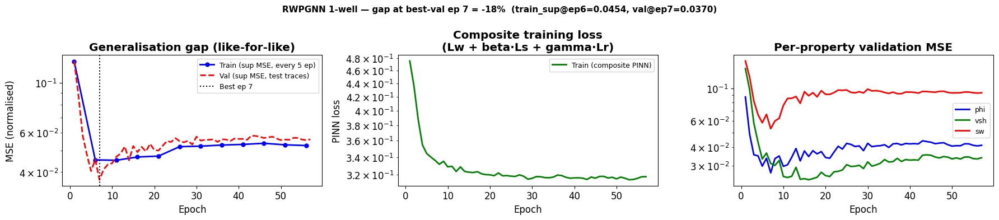

Generalisation gap at best-val ep 7: -18.5%  (acceptable)
  train_sup MSE @ ep 6 (nearest sparse point) = 0.04536
  val       MSE @ ep 7              = 0.03699


In [ ]:
# ── Part 2 Cell 5: Overfitting QC (like-for-like comparison) ────────────────
ep_ax = np.arange(1, len(hist_avo1['train'])+1)
fig, axes = plt.subplots(1, 3, figsize=(18, 4))

# Panel 1: like-for-like supervised MSE — comparable scales for train vs val
# train_sup is logged sparsely (every TRAIN_SUP_EVERY epochs; see cell 15).
axes[0].semilogy(hist_avo1['train_sup_ep'], hist_avo1['train_sup'], 'bo-',  ms=5, lw=2,
                 label='Train (sup MSE, every 5 ep)')
axes[0].semilogy(ep_ax, hist_avo1['val'], 'r--', lw=2,
                 label='Val (sup MSE, test traces)')
best_ep = int(np.argmin(hist_avo1['val'])) + 1
axes[0].axvline(best_ep, color='k', ls=':', lw=1.5, label=f'Best ep {best_ep}')
axes[0].set_title('Generalisation gap (like-for-like)', fontweight='bold')
axes[0].set_xlabel('Epoch'); axes[0].set_ylabel('MSE (normalised)')
axes[0].legend(fontsize=9)

# Panel 2: composite PGNN training loss (different scale — physics-included)
axes[1].semilogy(ep_ax, hist_avo1['train'], 'g-', lw=2, label='Train (composite PGNN)')
axes[1].set_title('Composite training loss\n(Lw + beta·Ls + gamma·Lr)', fontweight='bold')
axes[1].set_xlabel('Epoch'); axes[1].set_ylabel('PGNN loss')
axes[1].legend(fontsize=9)

# Panel 3: per-property validation breakdown
for col, key in zip(['b','g','r'], ['phi','vsh','sw']):
    axes[2].semilogy(ep_ax, hist_avo1[key], color=col, lw=2, label=key)
axes[2].set_title('Per-property validation MSE', fontweight='bold')
axes[2].set_xlabel('Epoch'); axes[2].legend(fontsize=9)

# Compute the generalisation gap at the BEST-VAL epoch (I5 fix).
# train_sup is logged sparsely (every TRAIN_SUP_EVERY epochs); pick the
# train_sup point at the train_sup_ep nearest to best_ep so train and val
# are measured at comparable points in training, not at independent minima.
best_val_mse  = hist_avo1['val'][best_ep - 1]   # best_ep is 1-indexed
_ts_eps  = np.asarray(hist_avo1['train_sup_ep'])
_ts_vals = np.asarray(hist_avo1['train_sup'])
_nearest_idx   = int(np.argmin(np.abs(_ts_eps - best_ep)))
train_sup_at_best = float(_ts_vals[_nearest_idx])
_train_sup_ep_used = int(_ts_eps[_nearest_idx])
gap_pct = 100 * (best_val_mse - train_sup_at_best) / (train_sup_at_best + 1e-12)
fig.suptitle(f'RWPGNN 1-well — gap at best-val ep {best_ep} = {gap_pct:+.0f}%  '
             f'(train_sup@ep{_train_sup_ep_used}={train_sup_at_best:.4f}, '
             f'val@ep{best_ep}={best_val_mse:.4f})',
             fontsize=11, fontweight='bold')
plt.tight_layout(); plt.savefig('fig03_qc_training.png', dpi=150, bbox_inches='tight'); plt.show()
print(f"Generalisation gap at best-val ep {best_ep}: {gap_pct:+.1f}%  "
      f"({'acceptable' if abs(gap_pct)<60 else 'INVESTIGATE'})")
print(f"  train_sup MSE @ ep {_train_sup_ep_used} (nearest sparse point) = {train_sup_at_best:.5f}")
print(f"  val       MSE @ ep {best_ep}              = {best_val_mse:.5f}")


In [ ]:
# ── Part 2 Cell 6: Reconstruct 2D sections (with MC Dropout uncertainty) ────
# Shared MC reconstruction utility used here and in cell 26.
# - Hoists X_all_n to GPU ONCE before the MC loop (avoids redundant H2D copies).
# - Requires mc_passes >= 3; fewer than 3 gives meaningless std estimates.
# - forward_fn(model_or_models, x_batch_gpu) -> (B, n_outputs) tensor on GPU.

def _mc_reconstruct(forward_fn, models_to_train_mode, X_all_n, mc_passes,
                     n_outputs=3, chunk=1024):
    """
    Generic MC-Dropout reconstruction over `coords`.

    forward_fn            : callable (x_batch_gpu) -> (B, n_outputs) tensor
    models_to_train_mode  : list of nn.Module — set to .train() to keep dropout
                            active during MC; restored to .eval() at the end.
    X_all_n               : (N, ...) NumPy array of patch features
    mc_passes             : int >= 3
    Returns               : (mean_norm, std_norm)  shape (N, n_outputs) each.
    """
    if mc_passes < 3:
        raise ValueError(f"mc_passes={mc_passes} is too few for meaningful std; "
                         f"use at least 3 (recommend >= 10).")

    # Hoist X to GPU once (E2 fix)
    X_gpu = torch.tensor(X_all_n).to(DEVICE)

    # Activate dropout
    for m in models_to_train_mode:
        m.train()

    all_passes = np.empty((mc_passes, X_gpu.shape[0], n_outputs), dtype=np.float32)
    with torch.no_grad():
        for p in range(mc_passes):
            for s in range(0, X_gpu.shape[0], chunk):
                all_passes[p, s:s+chunk] = forward_fn(X_gpu[s:s+chunk]).cpu().numpy()

    # Restore eval mode
    for m in models_to_train_mode:
        m.eval()
    del X_gpu

    return all_passes.mean(axis=0), all_passes.std(axis=0)


# Pre-extract i, j arrays from coords ONCE at module scope (invariant across calls)
_coord_i = np.fromiter((i for i, _ in coords), dtype=np.intp, count=len(coords))
_coord_j = np.fromiter((j for _, j in coords), dtype=np.intp, count=len(coords))

def _scatter_to_sections(mean_norm, std_norm, denorm_scale, denorm_shift, n_props):
    """Scatter flat per-coord predictions back into NaN-padded 2D sections.

    denorm_scale, denorm_shift : (n_props,) — physical = norm*scale + shift
    Returns: (secs[n_props], uncs[n_props]) lists of (NT, NX) arrays.

    I1 fix: NumPy advanced indexing instead of Python double-loop. ~9× faster.
    """
    mean_p = mean_norm * denorm_scale + denorm_shift     # (N, n_props)
    std_p  = std_norm  * denorm_scale
    secs, uncs = [], []
    for k in range(n_props):
        sec = np.full((NT, NX), np.nan, np.float32)
        unc = np.full((NT, NX), np.nan, np.float32)
        sec[_coord_i, _coord_j] = mean_p[:, k]
        unc[_coord_i, _coord_j] = std_p[:, k]
        secs.append(sec); uncs.append(unc)
    return secs, uncs


def reconstruct(model, X_all_n, mc_passes=20):
    """RWPGNN: single-model MC reconstruction. Returns ([phi_sec, vsh_sec, sw_sec],
    [phi_unc, vsh_unc, sw_unc])."""
    mean_n, std_n = _mc_reconstruct(
        lambda xb: model(xb), [model], X_all_n, mc_passes, n_outputs=3)
    return _scatter_to_sections(mean_n, std_n,
                                 denorm_scale=(y_max - y_min), denorm_shift=y_min,
                                 n_props=3)


print("Reconstructing RWPGNN 1-well sections (20 MC passes)...")
sec_avo1, unc_avo1 = reconstruct(RWPGNN_1w, X_avo_n, mc_passes=20)
phi_avo1, vsh_avo1, sw_avo1                = sec_avo1
phi_avo1_unc, vsh_avo1_unc, sw_avo1_unc    = unc_avo1
print("Done.")


Reconstructing RWPGNN 1-well sections (20 MC passes)...
Done.


Training RWPGNN with 2 wells (traces 100 and 51)...
  Well 1: x = 1408 m | Well 2: x = 718 m
  ep  30  train_PINN=0.31970  train_sup=0.03587  val=0.04456
  ep  60  train_PINN=0.31870  train_sup=0.04548  val=0.05442
  Early stop at epoch 64
Two-well best val MSE: 0.02666


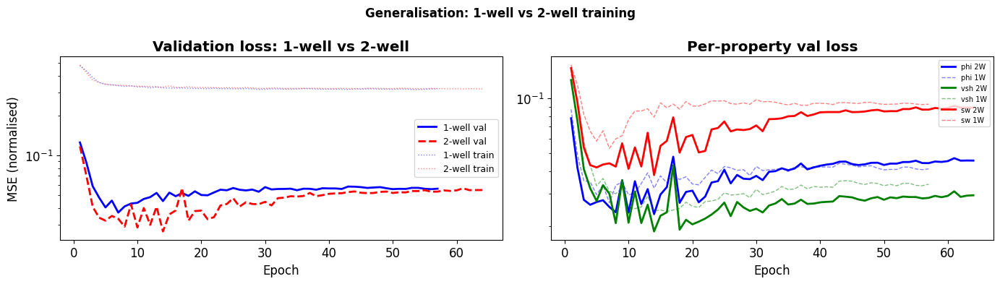

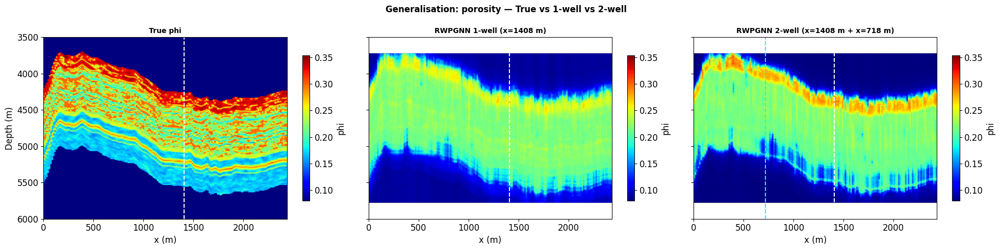

1-well best val: 0.03699 | 2-well best val: 0.02666


In [ ]:
# ── Part 2 Cell 7: Two-well generalisation test ──────────────────────────────
# x_loc2 is defined in Cell 12 (data prep) as trace 51 (x ≈ 714 m).
# Both x_loc and x_loc2 are guaranteed to be in train_mask (discarded from test set).
assert not np.any((trace_of == x_loc2) & test_mask), "Well 2 trace is in test set!"
print(f"Training RWPGNN with 2 wells (traces {x_loc} and {x_loc2})...")
print(f"  Well 1: x = {x_axis[x_loc]:.0f} m | Well 2: x = {x_axis[x_loc2]:.0f} m")
RWPGNN_2w, hist_avo2, bval_avo2 = train_RWPGNN(well_idx_list=[x_loc, x_loc2])
print(f"Two-well best val MSE: {bval_avo2:.5f}")
sec_avo2, unc_avo2 = reconstruct(RWPGNN_2w, X_avo_n, mc_passes=20)
phi_avo2, vsh_avo2, sw_avo2 = sec_avo2
phi_avo2_unc, vsh_avo2_unc, sw_avo2_unc = unc_avo2

# Training curves comparison
ep1 = np.arange(1, len(hist_avo1['train'])+1)
ep2 = np.arange(1, len(hist_avo2['train'])+1)
fig, axes = plt.subplots(1, 2, figsize=(14, 4))
axes[0].semilogy(ep1, hist_avo1['val'],   'b-',  lw=2, label='1-well val')
axes[0].semilogy(ep2, hist_avo2['val'],   'r--', lw=2, label='2-well val')
axes[0].semilogy(ep1, hist_avo1['train'], 'b:',  lw=1, alpha=0.5, label='1-well train')
axes[0].semilogy(ep2, hist_avo2['train'], 'r:',  lw=1, alpha=0.5, label='2-well train')
axes[0].set_title('Validation loss: 1-well vs 2-well', fontweight='bold')
axes[0].set_xlabel('Epoch'); axes[0].set_ylabel('MSE (normalised)'); axes[0].legend(fontsize=9)
for col, key in zip(['b','g','r'], ['phi','vsh','sw']):
    axes[1].semilogy(ep2, hist_avo2[key], color=col, lw=2,   label=f'{key} 2W')
    axes[1].semilogy(ep1, hist_avo1[key], color=col, lw=1, ls='--', alpha=0.5, label=f'{key} 1W')
axes[1].set_title('Per-property val loss', fontweight='bold')
axes[1].set_xlabel('Epoch'); axes[1].legend(fontsize=7)
plt.suptitle('Generalisation: 1-well vs 2-well training', fontsize=12, fontweight='bold')
plt.tight_layout(); plt.savefig('fig_rwpgnn_1w_2w_comparison.png', dpi=150, bbox_inches='tight'); plt.show()

# Section comparison
fig, axes = plt.subplots(1, 3, figsize=(20, 5), sharey=True)
vmin_p, vmax_p = PHI_VMIN, PHI_VMAX   # cached in cell 12
for ax, sec, title in zip(axes,
        [phi_2D, phi_avo1, phi_avo2],
        ['True phi',
         f'RWPGNN 1-well (x={x_axis[x_loc]:.0f} m)',
         f'RWPGNN 2-well (x={x_axis[x_loc]:.0f} m + x={x_axis[x_loc2]:.0f} m)']):
    im = ax.imshow(sec, aspect='auto', cmap='jet', extent=ext, vmin=vmin_p, vmax=vmax_p)
    ax.axvline(x_axis[x_loc], color='white', lw=1.5, ls='--', label='Well 1')
    if '2-well' in title:
        ax.axvline(x_axis[x_loc2], color='cyan', lw=1.5, ls='--', label='Well 2')
    ax.set_title(title, fontweight='bold', fontsize=10); ax.set_xlabel('x (m)')
    plt.colorbar(im, ax=ax, shrink=0.8)
axes[0].set_ylabel('Depth (m)')
plt.suptitle('Generalisation: porosity — True vs 1-well vs 2-well',
             fontsize=12, fontweight='bold')
plt.tight_layout(); plt.savefig('fig_rwpgnn_1w_2w_phi_sections.png', dpi=150, bbox_inches='tight'); plt.show()
print(f"1-well best val: {bval_avo1:.5f} | 2-well best val: {bval_avo2:.5f}")

## Part 2.5 — Training-Well Scaling Experiment: How Many Wells Does RWPGNN Need to Match Seis2Rock?

**Hypothesis.** Seis2Rock uses a physics-derived optimal basis (the SVD of Zoeppritz reflectivity wrt petrophysical parameters) and therefore needs only a single well to define the projection. RWPGNN is data-driven and must *learn* the mapping from AVO patch to petrophysical triple from labelled well patches. As the number of training wells increases, the effective supervisory coverage grows and RWPGNN's porosity reconstruction should converge toward the Seis2Rock porosity reconstruction in $R^2$ against the true section.

**What this experiment measures.** For $N \in \{1, 2, 4, 8, 16, 100\}$ training wells, we retrain RWPGNN (same architecture, same physics-informed loss, same epochs) and measure porosity $R^2$, RMSE, and RRE against the full true section. The first five values populate the realistic field-deployment regime (sparse to moderate well coverage); $N=100$ is an asymptotic diagnostic with ~71% of training traces labelled, included to bound the network's best-case performance under near-full supervision rather than as a like-for-like comparison with Seis2Rock. The Seis2Rock $R^2$ from Part 1 is the reference line. The question is *when* (at what $N$) the CNN catches up, and whether it can exceed the basis method.

**Experimental controls.**
- All well traces are drawn from the training pool (verified leakage-free against the `range(0, NX, 5)` test set used throughout Part 2).
- Wells at $N \geq 2$ always include the two canonical wells (`x_loc=100`, `x_loc2=51`) used in Cells 17–18, so the $N=1$ and $N=2$ results here should reproduce the earlier 1-well and 2-well runs to within random-seed variance (we use the same `torch.manual_seed(42)`).
- Additional wells for $N \in \{4, 8, 16, 100\}$ are spaced approximately evenly across the section, snapped to non-test traces.
- The physics-informed HM+Gassmann loss provides gradients at *all* training patches regardless of $N$, so the only thing that changes with $N$ is the number of patches that contribute supervised Vsh/Sw labels and direct phi labels.

**Honest limitations.**
1. This is a *synthetic* experiment on the Smeaheia dataset. The 'virtual wells' are noise-free, perfectly-located, and share the same rock-physics model as the forward modelling. On real data, each additional well adds positioning uncertainty, log-measurement noise, tie errors, and rock-physics-model mismatch — so real-world convergence will be slower and bounded by a lower ceiling.
2. The ceiling itself is set by Seis2Rock's amplitude-fidelity assumptions: the SVD is computed from the noise-free Zoeppritz reflectivity, and the inversion uses the *true* wavelet and *true* background model. Any departure from these (processing artefacts, wavelet estimation error, background model error) would lower the ceiling for both methods and change the comparison.
3. We hold the CNN architecture, learning rate, batch size, epochs, and regularisation fixed. A larger training set could in principle benefit from a larger model; this experiment does not optimise the architecture per $N$.
4. Wall-clock: each RWPGNN training run takes ~2–4 min on GPU, so the full sweep is ~10–20 min. On CPU, expect a multi-hour run — reduce the $N$ grid if needed.


Seis2Rock reference (test traces only): RMSE=0.02454  R²=0.9186  RRE=0.1252

N= 1  wells=[100] [reused]  phi R²=0.7277  epochs=57
N= 2  wells=[51, 100] [reused]  phi R²=0.7593  epochs=64
N= 4  wells=[4, 51, 100, 169]  phi R²=0.7999  epochs=203
N= 8  wells=[4, 37, 51, 69, 100, 103, 136, 169]  phi R²=0.8363  epochs=203
N=16  wells=[4, 17, 29, 42, 51, 54, 68, 79, 93, 100, 104, 118, 131, 143, 156, 169]  phi R²=0.8539  epochs=206
N=100  wells=[4, 6, 8, 9, 11, 13, 14, 16, 18, 19, 21, 23, 24, 26, 28, 29, 32, 33, 34, 37, 38, 39, 42, 43, 44, 47, 48, 49, 51, 52, 54, 56, 57, 59, 61, 62, 64, 66, 67, 69, 71, 72, 74, 76, 77, 79, 81, 82, 84, 86, 87, 89, 91, 92, 94, 96, 97, 99, 100, 101, 103, 104, 106, 108, 109, 111, 113, 114, 116, 118, 119, 121, 123, 124, 126, 128, 129, 131, 133, 134, 136, 138, 139, 141, 143, 144, 147, 148, 149, 152, 153, 154, 157, 158, 159, 162, 163, 164, 167, 169]  phi R²=0.9140  epochs=316

N wells |  phi RMSE |  phi R² |  ΔR² vs S2R |  phi RRE | epochs | time(s)
-----------------

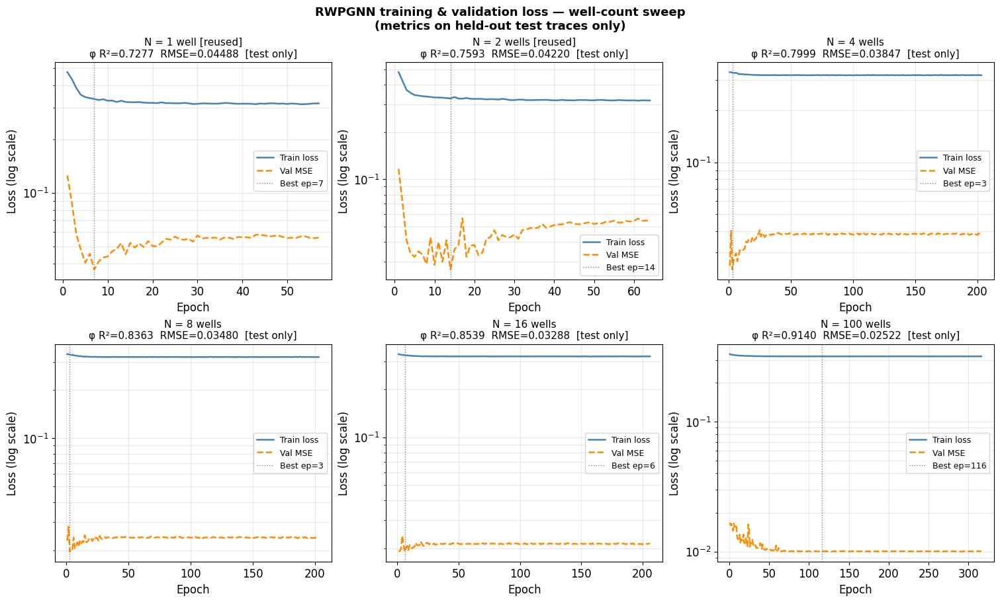

In [ ]:
# ── Part 2.5 Cell 1: Well-count sweep (efficient) ─────────────────────────────
import time

# ── Well-selection strategy ───────────────────────────────────────────────────
_effective_test = set(range(0, NX, 5)) - {x_loc, x_loc2}
_available      = [j for j in range(NX) if j not in _effective_test]

def select_wells(n_wells):
    """Pick n_wells training traces, always including x_loc (and x_loc2 if n_wells>=2)."""
    forced = [x_loc] if n_wells == 1 else [x_loc, x_loc2]
    forced = forced[:n_wells]
    remaining = n_wells - len(forced)
    if remaining == 0:
        return sorted(forced)
    pool = [j for j in _available if j not in forced]
    targets = np.linspace(5, NX - 5, remaining).astype(int)
    chosen = list(forced)
    for t in targets:
        cand = sorted(pool, key=lambda j: abs(j - t))
        for c in cand:
            if c not in chosen:
                chosen.append(c); pool.remove(c); break
    return sorted(chosen)

# ── Seis2Rock reference on TEST traces only (fair comparison) ─────────────────
# Precompute true phi flat over all coords once — reused by metrics functions.
phi_true_flat_all = np.array([phi_2D[i, j] for (i, j) in coords], dtype=np.float32)

_phi_s2r_flat = np.array([phi_s2r[i, j] for (i, j) in coords], dtype=np.float32)
_phi_s2r_test = _phi_s2r_flat[test_mask]
_phi_true_test = phi_true_flat_all[test_mask]
_valid = ~np.isnan(_phi_s2r_test)   # Seis2Rock has NaN outside its valid depth window

s2r_phi_rmse = float(np.sqrt(mean_squared_error(_phi_true_test[_valid], _phi_s2r_test[_valid])))
s2r_phi_r2   = float(r2_score(_phi_true_test[_valid], _phi_s2r_test[_valid]))
s2r_phi_rre  = float(np.linalg.norm(_phi_true_test[_valid] - _phi_s2r_test[_valid])
                     / np.linalg.norm(_phi_true_test[_valid]))
print(f"Seis2Rock reference (test traces only): RMSE={s2r_phi_rmse:.5f}  "
      f"R²={s2r_phi_r2:.4f}  RRE={s2r_phi_rre:.4f}")
print()

# ── Reuse hoisted GPU tensors from cell 12 ────────────────────────────────────
X_all_gpu       = torch.tensor(X_avo_n).to(DEVICE)
_trace_of_train = trace_of[train_mask]

# ── Fast trainer with per-epoch loss history ──────────────────────────────────
EPOCHS_FAST   = 500
PATIENCE_FAST = 200

def train_RWPGNN_fast(well_idx_list, init_state=None):
    Wmask = torch.tensor(np.isin(_trace_of_train, well_idx_list),
                         dtype=torch.bool, device=DEVICE)
    torch.manual_seed(42)
    model = RWPGNN(NTHETA, WIN).to(DEVICE)
    model = _maybe_compile(model)
    if init_state is not None:
        model.load_state_dict(init_state)
    dec = HMGassmannDecoder(wav.astype(np.float32)).to(DEVICE)
    for pp in dec.parameters():
        pp.requires_grad = False

    opt = torch.optim.Adam(model.parameters(), lr=LR, weight_decay=1e-4)
    sch = torch.optim.lr_scheduler.ReduceLROnPlateau(opt, patience=3, factor=0.5)
    n_train = len(Y_tr_gpu); n_batches = (n_train + BATCH - 1) // BATCH

    _amp_dtype = torch.float16 if DEVICE.type == 'cuda' else torch.bfloat16
    _use_amp   = (DEVICE.type == 'cuda')
    scaler     = torch.amp.GradScaler('cuda', enabled=_use_amp)
    WARMUP_EPOCHS_FAST = 2 if init_state is not None else WARMUP_EPOCHS

    history = {'train': [], 'val': []}

    best_val = float('inf'); best_st = None; pat = 0
    for ep in range(EPOCHS_FAST):
        if ep < WARMUP_EPOCHS_FAST:
            warm_lr = LR * (ep + 1) / WARMUP_EPOCHS_FAST
            for pg in opt.param_groups:
                pg['lr'] = warm_lr

        model.train()
        perm = torch.randperm(n_train, device=DEVICE)
        ep_loss = 0.0
        for b in range(n_batches):
            bidx = perm[b*BATCH:(b+1)*BATCH]
            opt.zero_grad(set_to_none=True)
            with torch.amp.autocast(device_type=DEVICE.type, dtype=_amp_dtype, enabled=_use_amp):
                preds = model(X_tr_gpu[bidx])
            preds = preds.float()
            loss, _ = PGNN_loss_hmg(preds, Y_tr_gpu[bidx],
                                    G_tr_gpu[bidx], dec, theta_rad_PGNN,
                                    Wmask[bidx],
                                    y_min_t=y_min_t, y_max_t=y_max_t)
            scaler.scale(loss).backward()
            scaler.step(opt)
            scaler.update()
            ep_loss += loss.item()

        history['train'].append(ep_loss / n_batches)

        model.eval()
        with torch.no_grad():
            vl = F.mse_loss(model(X_te_gpu), Y_te_gpu).item()
        history['val'].append(vl)
        sch.step(vl)

        if vl < best_val:
            best_val = vl
            best_st = {k: v.detach().clone() for k, v in model.state_dict().items()}
            pat = 0
        else:
            pat += 1
            if pat >= PATIENCE_FAST:
                break

    model.load_state_dict(best_st); model.eval()
    return model, best_val, ep + 1, history

# ── Inference and metrics helpers ─────────────────────────────────────────────
def predict_all_flat(model):
    """Eval-mode predictions over all coord patches. Returns (N, 3) denormed [phi, vsh, sw]."""
    model.eval()
    with torch.no_grad():
        out = []
        for s in range(0, N, 2048):
            out.append(model(X_all_gpu[s:s+2048]).cpu().numpy())
    pred_n = np.concatenate(out, axis=0)                       # (N, 3) normalised
    return pred_n * (y_max - y_min) + y_min                    # (N, 3) physical

def predict_phi_flat(model):
    """Backward-compat wrapper — returns just the phi column."""
    return predict_all_flat(model)[:, 0]

def flat_metrics_phi_test(phi_flat):
    """RMSE/R²/RRE on TEST traces only — truly unseen lateral positions."""
    return compute_metrics(phi_true_flat_all[test_mask], phi_flat[test_mask], mask_nans=False)

def build_section(flat_vals):
    """Scatter a flat (N,) array of predictions back into a 2D NaN-padded section."""
    sec = np.full((NT, NX), np.nan, dtype=np.float32)
    for idx, (i, j) in enumerate(coords):
        sec[i, j] = flat_vals[idx]
    return sec

def build_phi_section(phi_flat):
    """Backward-compat wrapper."""
    return build_section(phi_flat)

# ── Sweep ─────────────────────────────────────────────────────────────────────
N_WELLS_GRID   = [1, 2, 4, 8, 16, 100]
PLOT_NS        = {1, 4, 16, 100}

sweep_results  = []
sweep_sections = {}
sweep_histories = {}

_prev_state = None
for n_wells in N_WELLS_GRID:
    wells = select_wells(n_wells)
    assert all(w not in _effective_test for w in wells), f"Leakage at N={n_wells}"

    reused = False
    t0 = time.time()
    if n_wells == 1 and 'RWPGNN_1w' in globals() and wells == sorted([x_loc]):
        model_k = RWPGNN_1w; bval_k = bval_avo1
        n_epochs = len(hist_avo1['train'])
        history_k = hist_avo1
        reused = True
    elif n_wells == 2 and 'RWPGNN_2w' in globals() and wells == sorted([x_loc, x_loc2]):
        model_k = RWPGNN_2w; bval_k = bval_avo2
        n_epochs = len(hist_avo2['train'])
        history_k = hist_avo2
        reused = True
    else:
        model_k, bval_k, n_epochs, history_k = train_RWPGNN_fast(wells, init_state=_prev_state)
    t_train = time.time() - t0

    _prev_state = {k: v.detach().clone() for k, v in model_k.state_dict().items()}
    sweep_histories[n_wells] = history_k

    phi_flat = predict_phi_flat(model_k)
    rmse, r2, rre = flat_metrics_phi_test(phi_flat)   # ← test traces only
    if n_wells in PLOT_NS:
        all_flat = predict_all_flat(model_k)               # (N, 3)
        sweep_sections[n_wells] = {
            'phi': build_section(all_flat[:, 0]),
            'vsh': build_section(all_flat[:, 1]),
            'sw' : build_section(all_flat[:, 2]),
        }

    sweep_results.append({
        'n_wells': n_wells, 'wells': wells,
        'val_mse': bval_k,
        'phi_rmse': rmse, 'phi_r2': r2, 'phi_rre': rre,
        'n_epochs': n_epochs, 'reused': reused,
        'train_time_s': t_train,
    })
    tag = ' [reused]' if reused else ''
    print(f"N={n_wells:2d}  wells={wells}{tag}  phi R²={r2:.4f}  epochs={n_epochs}")

# ── Summary table ─────────────────────────────────────────────────────────────
print()
print("=" * 82)
print(f"{'N wells':>7} | {'phi RMSE':>9} | {'phi R²':>7} | {'ΔR² vs S2R':>11} | "
      f"{'phi RRE':>8} | {'epochs':>6} | {'time(s)':>7}")
print("-" * 82)
for r in sweep_results:
    dR = r['phi_r2'] - s2r_phi_r2
    mk = '  ← ≥ S2R' if dR >= 0 else ''
    rtag = '*' if r['reused'] else ' '
    print(f"{r['n_wells']:>6d}{rtag} | {r['phi_rmse']:>9.5f} | {r['phi_r2']:>7.4f} | "
          f"{dR:>+11.4f} | {r['phi_rre']:>8.4f} | {r['n_epochs']:>6d} | "
          f"{r['train_time_s']:>7.1f}{mk}")
print("-" * 82)
print(f"{'S2R':>7} | {s2r_phi_rmse:>9.5f} | {s2r_phi_r2:>7.4f} | {'(ref)':>11} | "
      f"{s2r_phi_rre:>8.4f} | {'—':>6} | {'—':>7}")
print("=" * 82)
print("*reused from Cells 15/18 (no retraining)")
print("All metrics computed on held-out test traces only (every 5th trace, excluding wells)")

crossover = next((r['n_wells'] for r in sweep_results if r['phi_r2'] >= s2r_phi_r2), None)
if crossover is not None:
    print(f"\n>>> RWPGNN reaches/exceeds Seis2Rock porosity R² at N = {crossover} wells.")
else:
    best = max(sweep_results, key=lambda r: r['phi_r2'])
    print(f"\n>>> RWPGNN did not reach Seis2Rock R² within N ≤ {max(N_WELLS_GRID)}. "
          f"Best: N={best['n_wells']} with R²={best['phi_r2']:.4f} "
          f"(gap {best['phi_r2']-s2r_phi_r2:+.4f}).")

# ── Loss curves — one subplot per N_wells ─────────────────────────────────────
n_runs = len(N_WELLS_GRID)
ncols  = 3
nrows  = (n_runs + ncols - 1) // ncols

fig, axes = plt.subplots(nrows, ncols, figsize=(15, 4.5 * nrows),
                         constrained_layout=True)
axes = axes.flatten()

for ax, n_wells in zip(axes, N_WELLS_GRID):
    hist = sweep_histories[n_wells]
    ep   = np.arange(1, len(hist['train']) + 1)

    ax.semilogy(ep, hist['train'], color='steelblue',  lw=1.8, label='Train loss')
    ax.semilogy(ep, hist['val'],   color='darkorange', lw=1.8, label='Val MSE',
                linestyle='--')

    best_ep = int(np.argmin(hist['val'])) + 1
    ax.axvline(best_ep, color='gray', lw=1, linestyle=':',
               label=f'Best ep={best_ep}')

    r = next(r for r in sweep_results if r['n_wells'] == n_wells)
    tag = ' [reused]' if r['reused'] else ''
    ax.set_title(f"N = {n_wells} well{'s' if n_wells > 1 else ''}{tag}\n"
                 f"φ R²={r['phi_r2']:.4f}  RMSE={r['phi_rmse']:.5f}  [test only]",
                 fontsize=11)
    ax.set_xlabel('Epoch'); ax.set_ylabel('Loss (log scale)')
    ax.legend(fontsize=9); ax.grid(True, which='both', alpha=0.3)

for ax in axes[n_runs:]:
    ax.set_visible(False)

fig.suptitle('RWPGNN training & validation loss — well-count sweep\n'
             '(metrics on held-out test traces only)',
             fontsize=13, fontweight='bold')
plt.savefig('sweep_loss_curves.png', dpi=150, bbox_inches='tight')
plt.show()


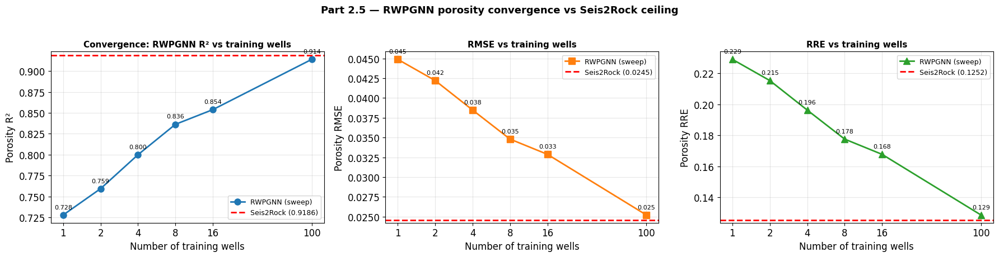

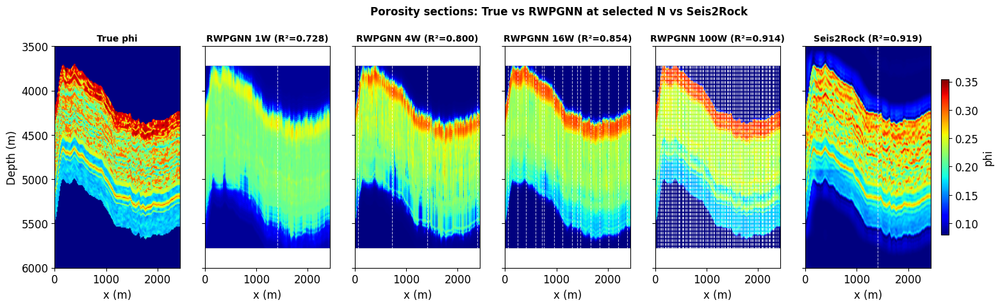


Interpretation
  RWPGNN R² at N=1:  0.7277
  RWPGNN R² at N=100: 0.9140
  Seis2Rock R²:      0.9186
  ΔR² from N=1 -> N=100: +0.1863
  Total sweep wall-clock: 1887.9s (2/6 reused)

  RWPGNN does not catch Seis2Rock within N ≤ 100.
  Residual gap at N = 100: ΔR² = -0.0046.

Caveat: synthetic with noise-free wells, true wavelet, true background.
Real-data crossover requires more wells and a lower ceiling.


In [ ]:
# ── Part 2.5 Cell 2: Convergence plot + porosity sections ─────────────────

ns    = [r['n_wells']  for r in sweep_results]
r2s   = [r['phi_r2']   for r in sweep_results]
rmses = [r['phi_rmse'] for r in sweep_results]
rres  = [r['phi_rre']  for r in sweep_results]

# ── Figure 1: convergence metrics vs N_wells ────────────────────────────────
fig, axes = plt.subplots(1, 3, figsize=(18, 4.5))

for ax, vals, ref, fmt, col, ylab, title in [
    (axes[0], r2s,   s2r_phi_r2,   'o-', '#1f77b4', 'Porosity R²',   'Convergence: RWPGNN R² vs training wells'),
    (axes[1], rmses, s2r_phi_rmse, 's-', '#ff7f0e', 'Porosity RMSE', 'RMSE vs training wells'),
    (axes[2], rres,  s2r_phi_rre,  '^-', '#2ca02c', 'Porosity RRE',  'RRE vs training wells'),
]:
    ax.plot(ns, vals, fmt, lw=2, ms=8, color=col, label='RWPGNN (sweep)')
    ax.axhline(ref, color='red', ls='--', lw=2, label=f'Seis2Rock ({ref:.4f})')
    ax.set_xscale('log', base=2); ax.set_xticks(ns); ax.set_xticklabels(ns)
    ax.set_xlabel('Number of training wells'); ax.set_ylabel(ylab)
    ax.set_title(title, fontweight='bold', fontsize=11)
    ax.grid(True, alpha=0.3); ax.legend(loc='best', fontsize=9)
# Value annotations on all three panels (consistent across metrics)
for ax_, vals_ in zip(axes, [r2s, rmses, rres]):
    for x_, y_ in zip(ns, vals_):
        ax_.annotate(f'{y_:.3f}', (x_, y_), textcoords='offset points',
                     xytext=(0, 8), ha='center', fontsize=8)

plt.suptitle('Part 2.5 — RWPGNN porosity convergence vs Seis2Rock ceiling',
             fontsize=13, fontweight='bold', y=1.02)
plt.tight_layout()
plt.savefig('fig_well_scaling_metrics.png', dpi=150, bbox_inches='tight'); plt.show()

# ── Figure 2: porosity sections (only for PLOT_NS, plus True + Seis2Rock) ──
vmin_p, vmax_p = PHI_VMIN, PHI_VMAX   # cached in cell 12
plot_ns_sorted = sorted(n for n in sweep_sections)     # N values we actually built

panels = [('True phi', phi_2D, None)]
for n in plot_ns_sorted:
    wells_n = next(r['wells'] for r in sweep_results if r['n_wells'] == n)
    r2_n    = next(r['phi_r2'] for r in sweep_results if r['n_wells'] == n)
    panels.append((f'RWPGNN {n}W (R²={r2_n:.3f})', sweep_sections[n]['phi'], wells_n))
panels.append((f'Seis2Rock (R²={s2r_phi_r2:.3f})', phi_s2r, [x_loc]))

ncols = len(panels)
fig, axes = plt.subplots(1, ncols, figsize=(3.5 * ncols, 4.5), sharey=True)
for ax, (title, sec, well_list) in zip(axes, panels):
    im = ax.imshow(sec, aspect='auto', cmap='jet', extent=ext, vmin=vmin_p, vmax=vmax_p)
    if well_list is not None:
        for w in well_list:
            ax.axvline(x_axis[w], color='white', lw=0.8, ls='--', alpha=0.7)
    ax.set_title(title, fontweight='bold', fontsize=10)
    ax.set_xlabel('x (m)')
axes[0].set_ylabel('Depth (m)')
fig.colorbar(im, ax=axes, shrink=0.7, label='phi', pad=0.01)
plt.suptitle('Porosity sections: True vs RWPGNN at selected N vs Seis2Rock',
             fontsize=12, fontweight='bold', y=1.02)
plt.savefig('fig_well_scaling_sections.png', dpi=150, bbox_inches='tight'); plt.show()

# ── Interpretation ───────────────────────────────────────────────────────────
first_r2 = sweep_results[0]['phi_r2']
last_r2  = sweep_results[-1]['phi_r2']
total_time = sum(r['train_time_s'] for r in sweep_results)
print()
print("Interpretation")
print("=" * 70)
print(f"  RWPGNN R² at N=1:  {first_r2:.4f}")
print(f"  RWPGNN R² at N={N_WELLS_GRID[-1]:<2d}: {last_r2:.4f}")
print(f"  Seis2Rock R²:      {s2r_phi_r2:.4f}")
print(f"  ΔR² from N=1 -> N={N_WELLS_GRID[-1]}: {last_r2 - first_r2:+.4f}")
print(f"  Total sweep wall-clock: {total_time:.1f}s "
      f"({sum(1 for r in sweep_results if r['reused'])}/{len(sweep_results)} reused)")
print()
if crossover is not None:
    print(f"  RWPGNN matches/exceeds Seis2Rock at N = {crossover} wells — the")
    print(f"  empirical amplitude-fidelity ceiling crossover on this synthetic.")
else:
    print(f"  RWPGNN does not catch Seis2Rock within N ≤ {max(N_WELLS_GRID)}.")
    print(f"  Residual gap at N = {N_WELLS_GRID[-1]}: ΔR² = {last_r2 - s2r_phi_r2:+.4f}.")
print()
print("Caveat: synthetic with noise-free wells, true wavelet, true background.")
print("Real-data crossover requires more wells and a lower ceiling.")


In [ ]:
model_100w = RWPGNN(NTHETA, WIN).to(DEVICE)
model_100w = _maybe_compile(model_100w) # Compile the model before loading state_dict
model_100w.load_state_dict(_prev_state)
model_100w.eval() # Set to eval mode to ensure consistent behavior

sec_100w, unc_100w = reconstruct(model_100w, X_avo_n)
phi_100w, vsh_100w, sw_100w = sec_100w

np.save('phi_pred_RWPGNN_100wells.npy', phi_100w)
print(f"Saved: phi_pred_RWPGNN_100wells.npy  shape={phi_100w.shape}  "
      f"[{np.nanmin(phi_100w):.4f}, {np.nanmax(phi_100w):.4f}]")

np.save('vsh_pred_RWPGNN_100wells.npy', vsh_100w)
print(f"Saved: vsh_pred_RWPGNN_100wells.npy  shape={vsh_100w.shape}  "
      f"[{np.nanmin(vsh_100w):.4f}, {np.nanmax(vsh_100w):.4f}]")

np.save('sw_pred_RWPGNN_100wells.npy', sw_100w)
print(f"Saved: sw_pred_RWPGNN_100wells.npy  shape={sw_100w.shape}  "
      f"[{np.nanmin(sw_100w):.4f}, {np.nanmax(sw_100w):.4f}]")

Saved: phi_pred_RWPGNN_100wells.npy  shape=(225, 174)  [0.0800, 0.3350]
Saved: vsh_pred_RWPGNN_100wells.npy  shape=(225, 174)  [0.0563, 1.0000]
Saved: sw_pred_RWPGNN_100wells.npy  shape=(225, 174)  [0.3137, 1.0000]


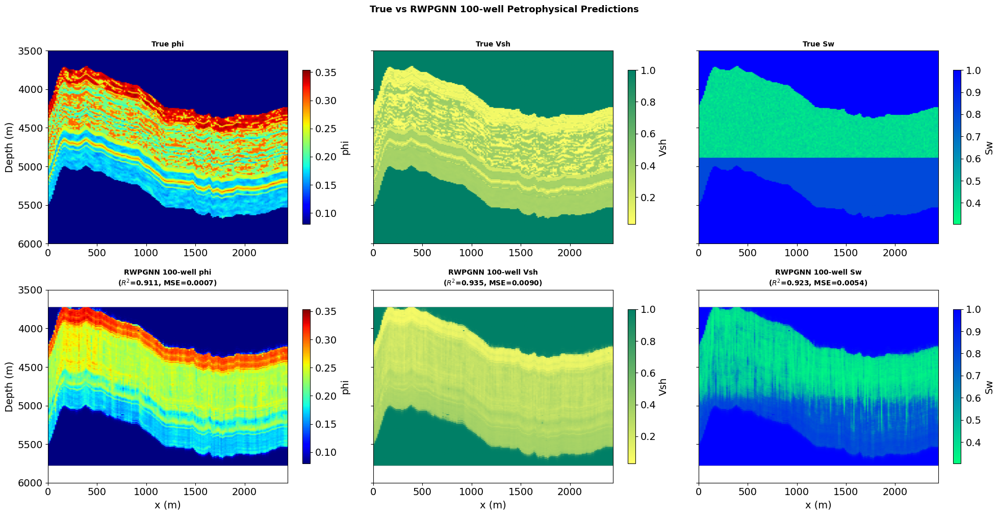

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score

# Helper function to compute metrics (already defined in the notebook, adding locally for clarity)
def compute_metrics_local(true_arr, pred_arr, mask_nans=True):
    t = np.asarray(true_arr).ravel()
    p = np.asarray(pred_arr).ravel()
    if mask_nans:
        m = ~np.isnan(p)
        t, p = t[m], p[m]
    rmse = float(np.sqrt(mean_squared_error(t, p)))
    r2   = float(r2_score(t, p))
    mse  = float(mean_squared_error(t, p))
    return rmse, r2, mse

# Reload the 100-well predictions from the saved .npy files
# This ensures the data is correctly loaded in case of kernel state issues
phi_100w = np.load('phi_pred_RWPGNN_100wells.npy')
vsh_100w = np.load('vsh_pred_RWPGNN_100wells.npy')
sw_100w  = np.load('sw_pred_RWPGNN_100wells.npy')

fig, axes = plt.subplots(2, 3, figsize=(20, 10), sharey=True)

plots_true = [
    (phi_2D, PHI_VMIN, PHI_VMAX, 'True phi', 'jet'),
    (vsh_2D, VSH_VMIN, VSH_VMAX, 'True Vsh', 'summer_r'), # Changed to summer_r
    (sw_2D,  SW_VMIN,  SW_VMAX,  'True Sw',  'winter_r')  # Changed to winter_r
]

plots_pred = [
    (phi_100w, PHI_VMIN, PHI_VMAX, 'RWPGNN 100-well phi', 'jet'),
    (vsh_100w, VSH_VMIN, VSH_VMAX, 'RWPGNN 100-well Vsh', 'summer_r'), # Changed to summer_r
    (sw_100w,  SW_VMIN,  SW_VMAX,  'RWPGNN 100-well Sw',  'winter_r')  # Changed to winter_r
]

# Plot True values in the top row
for i, (data, vmin_val, vmax_val, label, cmap) in enumerate(plots_true):
    ax = axes[0, i]
    im = ax.imshow(data, aspect='auto', cmap=cmap, extent=ext, vmin=vmin_val, vmax=vmax_val)
    ax.set_title(label, fontweight='bold', fontsize=10)
    if i == 0:
        ax.set_ylabel('Depth (m)')
    plt.colorbar(im, ax=ax, shrink=0.8, label=label.split(' ')[1])

# Plot 100-well predictions in the bottom row with metrics
for i, (pred_data, vmin_val, vmax_val, label, cmap) in enumerate(plots_pred):
    ax = axes[1, i]

    # Get true data for metric calculation
    true_data = plots_true[i][0]

    # Compute metrics
    rmse, r2, mse = compute_metrics_local(true_data, pred_data, mask_nans=True)

    im = ax.imshow(pred_data, aspect='auto', cmap=cmap, extent=ext, vmin=vmin_val, vmax=vmax_val)
    ax.set_title(f'{label}\n($R^2$={r2:.3f}, MSE={mse:.4f})', fontweight='bold', fontsize=10) # Added metrics to title
    ax.set_xlabel('x (m)')
    if i == 0:
        ax.set_ylabel('Depth (m)')
    plt.colorbar(im, ax=ax, shrink=0.8, label=label.split(' ')[-1])

plt.suptitle('True vs RWPGNN 100-well Petrophysical Predictions', fontsize=13, fontweight='bold', y=1.01)
plt.tight_layout()
plt.savefig('fig_true_vs_rwpgnn_100w.png', dpi=150, bbox_inches='tight')
plt.show()

## Part 3 — Das & Mukerji (2020): PetroNet and Cascaded CNN

End-to-end CNN (PetroNet) and cascaded ElasticNet → ElasticPetroNet.
Both trained on **all-trace labels** (synthetic ground truth everywhere).
MC Dropout (p=0.10, 20 passes) for uncertainty quantification.


Ip   : [3654286, 7905600] rayl
Vp/Vs: [1.76, 2.34]


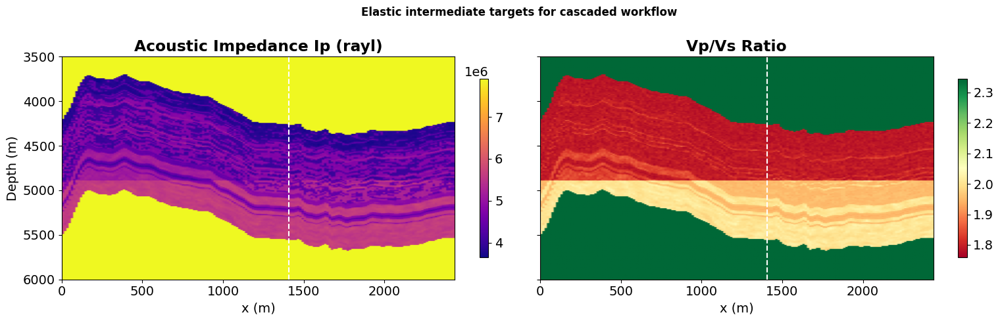

In [ ]:
# ── Part 3 Cell 1: Elastic intermediate targets ───────────────────────────────
Ip_2D    = (vp_2D * rho_2D).astype(np.float32)
VpVs_2D  = (vp_2D / (vs_2D + 1e-8)).astype(np.float32)

# I6: vectorised — reuses II/JJ meshgrid from cell 12 (still in scope)
Y_elast = np.stack([Ip_2D[II, JJ], VpVs_2D[II, JJ]], axis=-1).reshape(-1, 2).astype(np.float32)
assert Y_elast.shape == (N, 2), f"Y_elast shape mismatch: {Y_elast.shape}"
ye_min   = Y_elast.min(axis=0)
ye_max   = Y_elast.max(axis=0)
Y_elast_n = ((Y_elast - ye_min) / (ye_max - ye_min + 1e-8)).astype(np.float32)
denorm_elast = lambda y: y * (ye_max - ye_min) + ye_min

print(f"Ip   : [{Ip_2D.min():.0f}, {Ip_2D.max():.0f}] rayl")
print(f"Vp/Vs: [{VpVs_2D.min():.2f}, {VpVs_2D.max():.2f}]")

fig, axes = plt.subplots(1, 2, figsize=(16, 5), sharey=True)
for ax, data, title, cmap in zip(axes,
        [Ip_2D, VpVs_2D],
        ['Acoustic Impedance Ip (rayl)', 'Vp/Vs Ratio'],
        ['plasma', 'RdYlGn']):
    im = ax.imshow(data, aspect='auto', cmap=cmap, extent=ext)
    ax.axvline(x_axis[x_loc], color='white', lw=1.5, ls='--')
    ax.set_title(title, fontweight='bold'); ax.set_xlabel('x (m)')
    plt.colorbar(im, ax=ax, shrink=0.8)
axes[0].set_ylabel('Depth (m)')
plt.suptitle('Elastic intermediate targets for cascaded workflow', fontsize=12, fontweight='bold')
plt.tight_layout(); plt.savefig('fig_elastic_intermediate_targets.png', dpi=150, bbox_inches='tight'); plt.show()

In [ ]:
# ── Part 3 Cell 2: Das & Mukerji architectures ────────────────────────────────

class PetroNet(nn.Module):
    """End-to-end 1D CNN: AVO gather -> (phi, Vsh, Sw). Das & Mukerji Workflow 1."""
    def __init__(self, ntheta, win, n_petro=3, drop_p=0.10):
        super().__init__()
        self.conv = nn.Sequential(
            nn.Conv1d(ntheta, 64, 7, padding=3), nn.ReLU(), nn.BatchNorm1d(64),
            nn.Conv1d(64, 64, 5, padding=2), nn.ReLU(), nn.BatchNorm1d(64), nn.MaxPool1d(2),
            nn.Conv1d(64, 32, 3, padding=1), nn.ReLU(), nn.BatchNorm1d(32), nn.MaxPool1d(2))
        flat = self.conv(torch.zeros(1, ntheta, win)).view(1,-1).shape[1]
        self.fc = nn.Sequential(
            nn.Linear(flat,128), nn.ReLU(), nn.Dropout(drop_p),
            nn.Linear(128, 64), nn.ReLU(), nn.Dropout(drop_p))
        self.heads = nn.ModuleList(
            [nn.Sequential(nn.Linear(64,1), nn.Sigmoid()) for _ in range(n_petro)])
    def forward(self, x):
        f = self.fc(self.conv(x).view(x.size(0),-1))
        return torch.cat([h(f) for h in self.heads], dim=1)

class ElasticNet(nn.Module):
    """Stage 1: AVO gather -> elastic (Ip, Vp/Vs). Das & Mukerji Workflow 2a."""
    def __init__(self, ntheta, win, drop_p=0.10):
        super().__init__()
        self.conv = nn.Sequential(
            nn.Conv1d(ntheta, 64, 7, padding=3), nn.ReLU(), nn.BatchNorm1d(64),
            nn.Conv1d(64, 64, 5, padding=2), nn.ReLU(), nn.BatchNorm1d(64), nn.MaxPool1d(2),
            nn.Conv1d(64, 32, 3, padding=1), nn.ReLU(), nn.BatchNorm1d(32), nn.MaxPool1d(2))
        flat = self.conv(torch.zeros(1, ntheta, win)).view(1,-1).shape[1]
        self.fc  = nn.Sequential(
            nn.Linear(flat,128), nn.ReLU(), nn.Dropout(drop_p),
            nn.Linear(128, 64), nn.ReLU(), nn.Dropout(drop_p))
        self.out = nn.Sequential(nn.Linear(64,2), nn.Sigmoid())
    def forward(self, x):
        return self.out(self.fc(self.conv(x).view(x.size(0),-1)))

class ElasticPetroNet(nn.Module):
    """Stage 2: elastic (Ip, Vp/Vs) -> (phi, Vsh, Sw). Das & Mukerji Workflow 2b."""
    def __init__(self, n_elast=2, n_petro=3, drop_p=0.10):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(n_elast,64), nn.ReLU(), nn.Dropout(drop_p),
            nn.Linear(64,64), nn.ReLU(), nn.Dropout(drop_p),
            nn.Linear(64,32), nn.ReLU(), nn.Dropout(drop_p))
        self.heads = nn.ModuleList(
            [nn.Sequential(nn.Linear(32,1), nn.Sigmoid()) for _ in range(n_petro)])
    def forward(self, x):
        f = self.net(x)
        return torch.cat([h(f) for h in self.heads], dim=1)

n_pn   = sum(p.numel() for p in PetroNet(NTHETA,WIN).parameters())
n_casc = (sum(p.numel() for p in ElasticNet(NTHETA,WIN).parameters()) +
          sum(p.numel() for p in ElasticPetroNet().parameters()))
print(f"PetroNet: {n_pn:,} params | Cascaded: {n_casc:,} params ({n_casc/n_pn:.1f}x)")


PetroNet: 94,563 params | Cascaded: 101,029 params (1.1x)


Training PetroNet (end-to-end, all-trace labels)...


W0507 15:01:55.521000 11961 torch/_inductor/utils.py:1679] [1/0] Not enough SMs to use max_autotune_gemm mode


  [PetroNet] ep  40  val=0.00185
PetroNet best val MSE: 0.00163

Training ElasticNet (stage 1: AVO -> elastic)...
  [ElasticNet] ep  40  val=0.00049
ElasticNet best val MSE: 0.00045

Training ElasticPetroNet (stage 2: elastic -> petro)...
  [ElasticPetroNet] ep  40  val=0.00202
Cascaded best val MSE: 0.00195


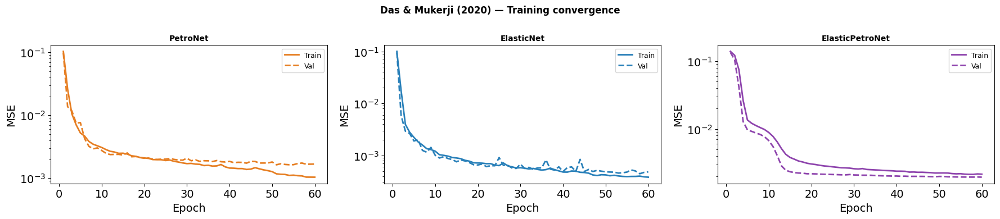

In [ ]:
# ── Part 3 Cell 3: Training (all-trace labels) ────────────────────────────────
EPOCHS_DM = 60; BATCH_DM = 1024; PAT_DM = 10   # S2+S5: larger batch, tighter patience

# Reuse hoisted GPU tensors from cell 12 for the AVO patches and petro targets;
# upload only the elastic targets (specific to Part 3).
X_tr_t  = X_tr_gpu
Y_tr_t  = Y_tr_gpu
X_te_t  = X_te_gpu
Y_te_t  = Y_te_gpu
Ye_tr_t = torch.tensor(Y_elast_n[train_mask]).to(DEVICE)
Ye_te_t = torch.tensor(Y_elast_n[test_mask]).to(DEVICE)

def train_dm(model, Xtr, Ytr, Xte, Yte, tag):
    # S2: contiguous slicing on a per-epoch perm (faster than DataLoader on hoisted GPU tensors)
    n_train = len(Ytr); n_batches = (n_train + BATCH_DM - 1) // BATCH_DM
    opt = torch.optim.Adam(model.parameters(), lr=1e-3, weight_decay=1e-5)
    sch = torch.optim.lr_scheduler.ReduceLROnPlateau(opt, patience=5, factor=0.5)

    # S1: AMP on GPU
    _amp_dtype = torch.float16 if DEVICE.type == 'cuda' else torch.bfloat16
    _use_amp   = (DEVICE.type == 'cuda')
    scaler     = torch.amp.GradScaler('cuda', enabled=_use_amp)

    best = float('inf'); bst = None; pat = 0; hist = {'t':[], 'v':[]}
    for ep in range(EPOCHS_DM):
        # 5-epoch warmup for the larger batch
        if ep < 5:
            for pg in opt.param_groups:
                pg['lr'] = 1e-3 * (ep + 1) / 5

        model.train(); el = 0.0
        perm = torch.randperm(n_train, device=DEVICE)
        for b in range(n_batches):
            bidx = perm[b*BATCH_DM:(b+1)*BATCH_DM]
            opt.zero_grad(set_to_none=True)
            with torch.amp.autocast(device_type=DEVICE.type, dtype=_amp_dtype, enabled=_use_amp):
                pred = model(Xtr[bidx])
                loss = F.mse_loss(pred.float(), Ytr[bidx])
            scaler.scale(loss).backward()
            scaler.step(opt); scaler.update()
            el += loss.item()
        hist['t'].append(el / n_batches); model.eval()
        with torch.no_grad(): vl = F.mse_loss(model(Xte), Yte).item()
        hist['v'].append(vl); sch.step(vl)
        if vl < best: best = vl; bst = copy.deepcopy(model.state_dict()); pat = 0
        else: pat += 1
        if (ep+1) % 40 == 0:
            print(f"  [{tag}] ep {ep+1:3d}  val={vl:.5f}")
        if pat >= PAT_DM:
            print(f"  [{tag}] early stop ep {ep+1}"); break
    if bst is not None:
        model.load_state_dict(bst)
    model.eval(); return hist, best

print("Training PetroNet (end-to-end, all-trace labels)...")
torch.manual_seed(42); petronet = _maybe_compile(PetroNet(NTHETA, WIN).to(DEVICE))
hist_pn, bval_pn = train_dm(petronet, X_tr_t, Y_tr_t, X_te_t, Y_te_t, "PetroNet")
print(f"PetroNet best val MSE: {bval_pn:.5f}")

print("\nTraining ElasticNet (stage 1: AVO -> elastic)...")
torch.manual_seed(42); elasticnet = _maybe_compile(ElasticNet(NTHETA, WIN).to(DEVICE))
hist_en, bval_en = train_dm(elasticnet, X_tr_t, Ye_tr_t, X_te_t, Ye_te_t, "ElasticNet")
for pp in elasticnet.parameters(): pp.requires_grad = False
elasticnet.eval()
print(f"ElasticNet best val MSE: {bval_en:.5f}")

print("\nTraining ElasticPetroNet (stage 2: elastic -> petro)...")
with torch.no_grad():
    E_tr = elasticnet(X_tr_t); E_te = elasticnet(X_te_t)
torch.manual_seed(42); epnet = _maybe_compile(ElasticPetroNet().to(DEVICE))
hist_epn, bval_epn = train_dm(epnet, E_tr, Y_tr_t, E_te, Y_te_t, "ElasticPetroNet")
print(f"Cascaded best val MSE: {bval_epn:.5f}")

# Training curves
fig, axes = plt.subplots(1, 3, figsize=(18, 4))
for ax, hist, title, col in zip(axes,
        [hist_pn, hist_en, hist_epn],
        ['PetroNet','ElasticNet','ElasticPetroNet'],
        ['#e67e22','#2980b9','#8e44ad']):
    ep = np.arange(1, len(hist['t'])+1)
    ax.semilogy(ep, hist['t'], color=col, lw=2, label='Train')
    ax.semilogy(ep, hist['v'], color=col, lw=2, ls='--', label='Val')
    ax.set_title(title, fontweight='bold', fontsize=10)
    ax.set_xlabel('Epoch'); ax.set_ylabel('MSE'); ax.legend(fontsize=9)
plt.suptitle('Das & Mukerji (2020) — Training convergence', fontsize=12, fontweight='bold')
plt.tight_layout(); plt.savefig('fig_dm_training_convergence.png', dpi=150, bbox_inches='tight'); plt.show()

In [ ]:
# ── Part 3 Cell 4: MC Dropout reconstruction (using shared utility) ─────────
# Uses _mc_reconstruct + _scatter_to_sections from cell 17.

def mc_petronet(model, X_all_n, n_passes=20):
    mean_n, std_n = _mc_reconstruct(
        lambda xb: model(xb), [model], X_all_n, n_passes, n_outputs=3)
    return _scatter_to_sections(mean_n, std_n,
                                 denorm_scale=(y_max - y_min), denorm_shift=y_min,
                                 n_props=3)

def mc_cascaded(en, epn, X_all_n, n_passes=20):
    mean_n, std_n = _mc_reconstruct(
        lambda xb: epn(en(xb)), [en, epn], X_all_n, n_passes, n_outputs=3)
    return _scatter_to_sections(mean_n, std_n,
                                 denorm_scale=(y_max - y_min), denorm_shift=y_min,
                                 n_props=3)

print("MC Dropout — PetroNet (20 passes)...")
sec_pn, unc_pn = mc_petronet(petronet, X_avo_n, n_passes=20)
phi_pn, vsh_pn, sw_pn = sec_pn
unc_pn_phi = unc_pn[0]

print("MC Dropout — Cascaded (20 passes)...")
sec_casc, unc_casc = mc_cascaded(elasticnet, epnet, X_avo_n, n_passes=20)
phi_casc, vsh_casc, sw_casc = sec_casc
unc_casc_phi = unc_casc[0]

print("All sections assembled.")


MC Dropout — PetroNet (20 passes)...
MC Dropout — Cascaded (20 passes)...
All sections assembled.


## Part 4 — Comprehensive Comparison

All five methods on identical data and train/test split:
1. Seis2Rock (Corrales 2024) — linear SVD + Laplacian
2. RWPGNN 1-well — 2D CNN + HM+Gassmann PGNN
3. RWPGNN 2-well — same, with second training well
4. RWPGNN 100-well — same, with second training well
5. PetroNet (Das & Mukerji 2020) — 1D CNN end-to-end, all-trace labels



In [ ]:
# ── Part 4 Cell 1: Metrics ───────────────────────────────────────────────────
def metrics(true2d, pred2d, name=''):
    rmse, r2, rre = compute_metrics(true2d, pred2d, mask_nans=True)
    if name: print(f"  {name:<38} RMSE={rmse:.4f}  R2={r2:.4f}  RRE={rre:.4f}")
    return rmse, r2, rre

# I8 fix: single source of truth for (method, colour) — used by cells 28, 32, 33, 34.
# Order matters; iteration order is insertion order in Python 3.7+.
METHOD_STYLE = {
    'Seis2Rock'      : '#3498db',
    'RWPGNN 1-well': '#27ae60',
    'RWPGNN 2-well': '#2ecc71',
    'PetroNet'       : '#e67e22',
    'Cascaded'       : '#8e44ad',
}
method_names  = list(METHOD_STYLE.keys())
method_colors = list(METHOD_STYLE.values())
preds_phi     = [phi_s2r, phi_avo1, phi_avo2, phi_pn, phi_casc]
preds_vsh     = [vsh_s2r, vsh_avo1, vsh_avo2, vsh_pn, vsh_casc]
preds_sw      = [sw_s2r,  sw_avo1,  sw_avo2,  sw_pn,  sw_casc]

rows = []
print(f"{'Method':<22} {'phi RMSE':>9} {'phi R2':>7} {'Vsh RMSE':>10} {'Vsh R2':>7} {'Sw RMSE':>9} {'Sw R2':>7}")
print("-" * 80)
for name, pp, pv, ps in zip(method_names, preds_phi, preds_vsh, preds_sw):
    # Suppress per-call prints (name='') so the table below is the only output
    mp = metrics(phi_2D, pp);  mv = metrics(vsh_2D, pv);  ms = metrics(sw_2D, ps)
    rows.append({'name':name,'phi_rmse':mp[0],'phi_r2':mp[1],
                 'vsh_rmse':mv[0],'vsh_r2':mv[1],'sw_rmse':ms[0],'sw_r2':ms[1]})
    print(f"  {name:<20} {mp[0]:9.4f} {mp[1]:7.4f} {mv[0]:10.4f} {mv[1]:7.4f} "
          f"{ms[0]:9.4f} {ms[1]:7.4f}")


Method                  phi RMSE  phi R2   Vsh RMSE  Vsh R2   Sw RMSE   Sw R2
--------------------------------------------------------------------------------
  Seis2Rock               0.0222  0.9331     0.0869  0.9482    0.0603  0.9472
  RWPGNN 1-well           0.0446  0.7291     0.1626  0.8097    0.1639  0.6157
  RWPGNN 2-well           0.0420  0.7603     0.1413  0.8563    0.1383  0.7262
  PetroNet                0.0095  0.9878     0.0359  0.9907    0.0206  0.9939
  Cascaded                0.0124  0.9791     0.0475  0.9837    0.0240  0.9918


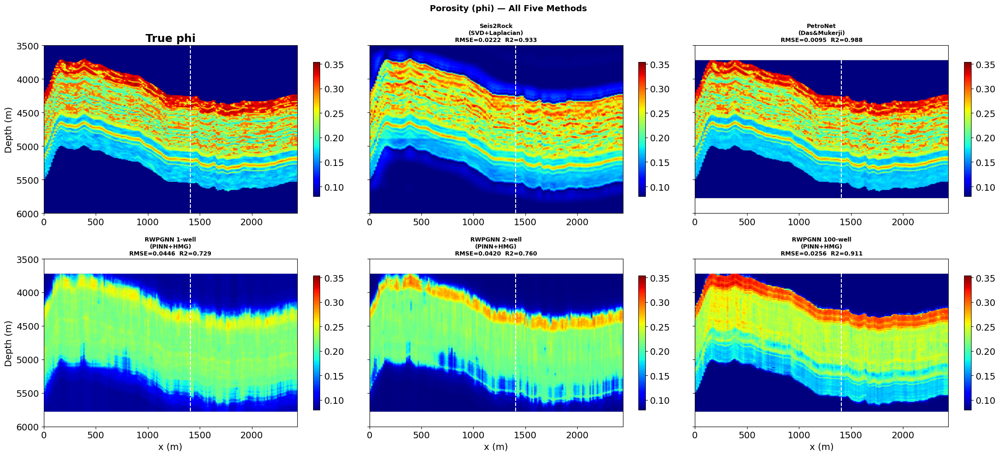

In [ ]:
# ── Part 4 Cell 2: Five-method porosity sections ──────────────────────────────
fig, axes = plt.subplots(2, 3, figsize=(22, 10), sharey=True)
vmin_p, vmax_p = PHI_VMIN, PHI_VMAX   # cached in cell 12

# True phi in top-left
im0 = axes[0,0].imshow(phi_2D, aspect='auto', cmap='jet', extent=ext,
                        vmin=vmin_p, vmax=vmax_p)
axes[0,0].axvline(x_axis[x_loc], color='white', lw=1.5, ls='--')
axes[0,0].set_title('True phi', fontweight='bold')
axes[0,0].set_ylabel('Depth (m)')
plt.colorbar(im0, ax=axes[0,0], shrink=0.8)

# Five method panels — explicit (row, col) layout (top-left = True, fills row-major)
all_phi   = [phi_s2r, phi_avo1, phi_avo2, phi_100w, phi_pn]
all_names = ['Seis2Rock\n(SVD+Laplacian)', 'RWPGNN 1-well\n(PGNN+HMG)',
             'RWPGNN 2-well\n(PGNN+HMG)', 'RWPGNN 100-well\n(PGNN+HMG)',  'PetroNet\n(Das&Mukerji)',
             ]
panel_pos = [(0,1), (1,0), (1,1), (1,2), (0,2)]   # 5 method panels (top-left taken by True)

for (row, col), pp, nm in zip(panel_pos, all_phi, all_names):
    ax = axes[row, col]
    mi  = metrics(phi_2D, pp)
    im  = ax.imshow(pp, aspect='auto', cmap='jet', extent=ext, vmin=vmin_p, vmax=vmax_p)
    ax.axvline(x_axis[x_loc], color='white', lw=1.5, ls='--')
    ax.set_title(f'{nm}\nRMSE={mi[0]:.4f}  R2={mi[1]:.3f}', fontweight='bold', fontsize=9)
    plt.colorbar(im, ax=ax, shrink=0.8)
    if col == 0: ax.set_ylabel('Depth (m)')
    if row == 1: ax.set_xlabel('x (m)')

plt.suptitle('Porosity (phi) — All Five Methods', fontsize=13, fontweight='bold')
plt.tight_layout()
plt.savefig('fig04_all5_phi.png', dpi=150, bbox_inches='tight'); plt.show()

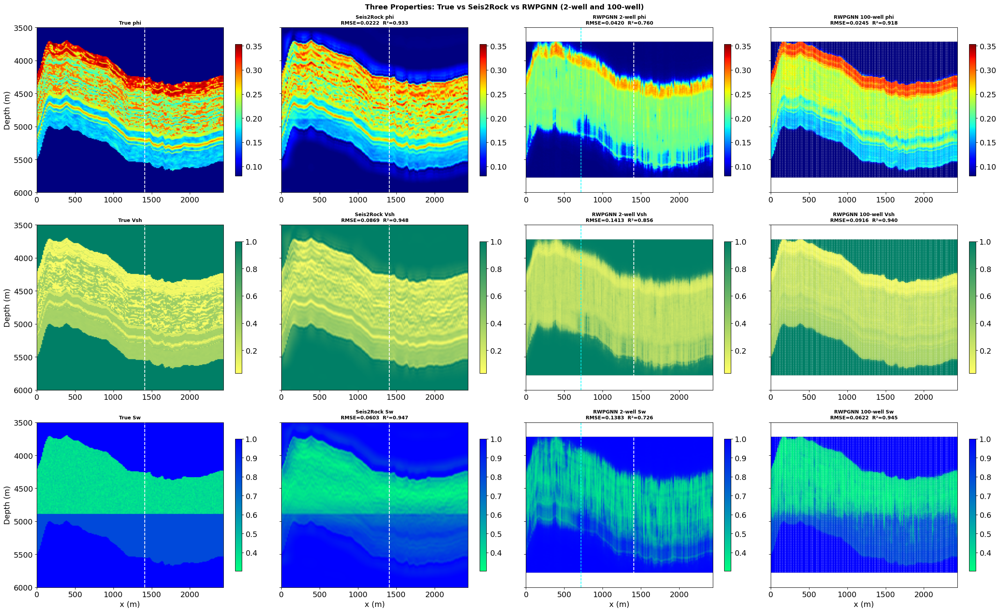

In [ ]:
# ── Part 4 Cell 3: Three-property comparison ──────────────────────────────────
fig, axes = plt.subplots(3, 4, figsize=(26, 16), sharey=True)

wells_100 = next(r['wells'] for r in sweep_results if r['n_wells'] == 100)
sec100 = sweep_sections[100]   # dict with 'phi', 'vsh', 'sw'

props = [
    (phi_2D, phi_s2r, phi_avo2, sec100['phi'], 'phi', 'jet'),
    (vsh_2D, vsh_s2r, vsh_avo2, sec100['vsh'], 'Vsh', 'summer_r'),
    (sw_2D,  sw_s2r,  sw_avo2,  sec100['sw'],  'Sw',  'winter_r'),
]

col_titles = ['True', 'Seis2Rock', 'RWPGNN 2-well', 'RWPGNN 100-well']

for row, (true, s2r, cnn2w, cnn100w, lbl, cm) in enumerate(props):
    v0, v1 = true.min(), true.max()
    sections = [true, s2r, cnn2w, cnn100w]

    for col, (sec, ctitle) in enumerate(zip(sections, col_titles)):
        ax = axes[row, col]
        im = ax.imshow(sec, aspect='auto', cmap=cm, extent=ext, vmin=v0, vmax=v1)

        # Well markers — column-specific
        if col in (0, 1):
            ax.axvline(x_axis[x_loc], color='white', lw=1.5, ls='--')
        elif col == 2:
            ax.axvline(x_axis[x_loc],  color='white', lw=1.5, ls='--')
            ax.axvline(x_axis[x_loc2], color='cyan',  lw=1.2, ls='--')
        elif col == 3:
            for w_idx in wells_100:
                ax.axvline(x_axis[w_idx], color='white', lw=0.6, ls='--', alpha=0.5)

        # Title — include RMSE/R² for the three prediction columns
        if col == 0:
            ax.set_title(f'True {lbl}', fontweight='bold', fontsize=9)
        else:
            mi = metrics(true, sec)
            ax.set_title(f'{ctitle} {lbl}\nRMSE={mi[0]:.4f}  R²={mi[1]:.3f}',
                         fontweight='bold', fontsize=9)

        if col == 0:  ax.set_ylabel('Depth (m)')
        if row == 2:  ax.set_xlabel('x (m)')
        plt.colorbar(im, ax=ax, shrink=0.8)

plt.suptitle('Three Properties: True vs Seis2Rock vs RWPGNN (2-well and 100-well)',
             fontsize=13, fontweight='bold')
plt.tight_layout()
plt.savefig('fig05_three_props.png', dpi=150, bbox_inches='tight'); plt.show()


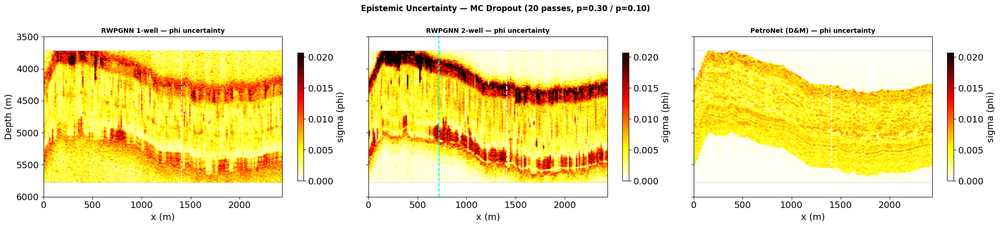

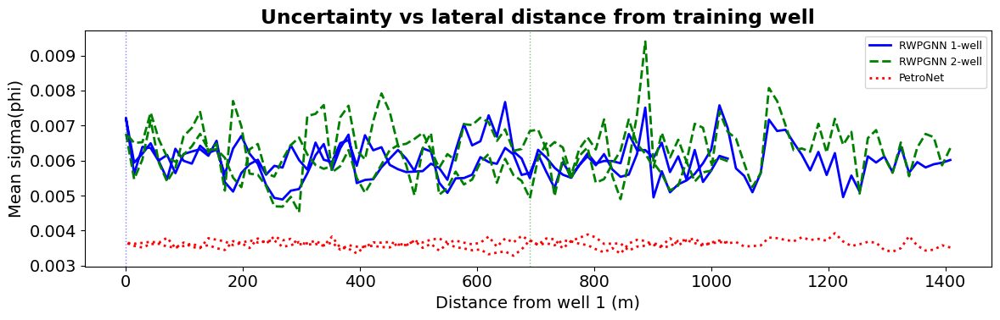

Uncertainty increases with distance from training well — as expected.


In [ ]:
# ── Part 4 Cell 4: MC Dropout uncertainty sections ────────────────────────────
# ── Fig 6a: phi uncertainty for all three RWPGNN/PetroNet variants ───────────
fig, axes = plt.subplots(1, 3, figsize=(22, 5), sharey=True)
vm_u = max(np.nanpercentile(phi_avo1_unc, 97),
           np.nanpercentile(phi_avo2_unc, 97),
           np.nanpercentile(unc_pn_phi, 97))
for ax, unc, title in zip(axes,
        [phi_avo1_unc, phi_avo2_unc, unc_pn_phi],
        ['RWPGNN 1-well — phi uncertainty',
         'RWPGNN 2-well — phi uncertainty',
         'PetroNet (D&M) — phi uncertainty']):
    im = ax.imshow(unc, aspect='auto', cmap='hot_r', extent=ext, vmin=0, vmax=vm_u)
    ax.axvline(x_axis[x_loc], color='white', lw=1.5, ls='--')
    if '2-well' in title:
        ax.axvline(x_axis[x_loc2], color='cyan', lw=1.5, ls='--')
    ax.set_title(title, fontweight='bold', fontsize=10); ax.set_xlabel('x (m)')
    plt.colorbar(im, ax=ax, shrink=0.8, label='sigma (phi)')
axes[0].set_ylabel('Depth (m)')
plt.suptitle('Epistemic Uncertainty — MC Dropout (20 passes, p=0.30 / p=0.10)',
             fontsize=12, fontweight='bold')
plt.tight_layout(); plt.savefig('fig06_uncertainty.png', dpi=150, bbox_inches='tight'); plt.show()

# ── Fig 6b: uncertainty vs distance from well ─────────────────────────────────
fig, ax = plt.subplots(figsize=(12, 4))
dist = np.abs(x_axis - x_axis[x_loc])
ax.plot(dist, np.nanmean(phi_avo1_unc, axis=0), 'b-',  lw=2, label='RWPGNN 1-well')
ax.plot(dist, np.nanmean(phi_avo2_unc, axis=0), 'g--', lw=2, label='RWPGNN 2-well')
ax.plot(dist, np.nanmean(unc_pn_phi,   axis=0), 'r:',  lw=2, label='PetroNet')
ax.axvline(0, color='b', ls=':', lw=1, alpha=0.5)
ax.axvline(np.abs(x_axis[x_loc2]-x_axis[x_loc]), color='g', ls=':', lw=1, alpha=0.5)
ax.set_xlabel('Distance from well 1 (m)'); ax.set_ylabel('Mean sigma(phi)')
ax.set_title('Uncertainty vs lateral distance from training well', fontweight='bold')
ax.legend(fontsize=9)
plt.tight_layout(); plt.show()
print("Uncertainty increases with distance from training well — as expected.")


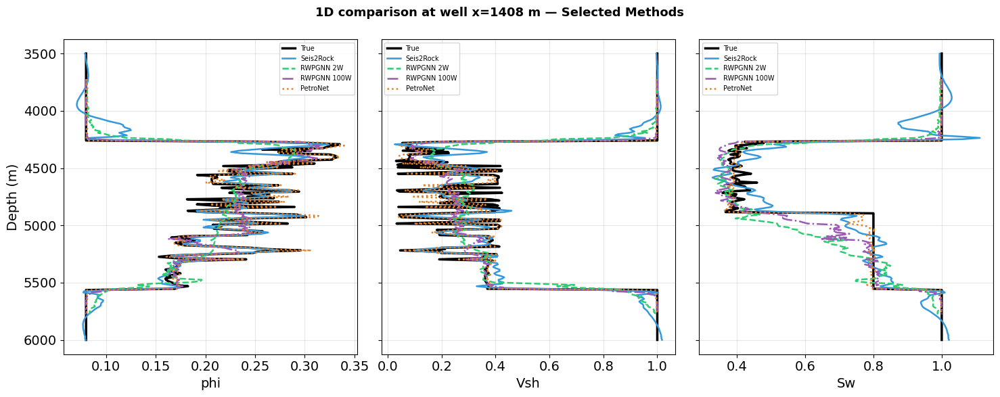

In [ ]:
# ── Part 4 Cell 5: 1D well comparison — all methods ───────────────────────────
fig, axes = plt.subplots(1, 3, figsize=(15, 6), sharey=True)

# Define methods to plot and their styles
methods_to_compare = {
    'Seis2Rock':     {'phi': phi_s2r, 'vsh': vsh_s2r, 'sw': sw_s2r, 'color': METHOD_STYLE['Seis2Rock'], 'linestyle': '-'},
    'RWPGNN 2-well': {'phi': phi_avo2, 'vsh': vsh_avo2, 'sw': sw_avo2, 'color': METHOD_STYLE['RWPGNN 2-well'], 'linestyle': '--'},
    'RWPGNN 100-well': {'phi': phi_100w, 'vsh': vsh_100w, 'sw': sw_100w, 'color': METHOD_STYLE['RWPGNN 100-well'], 'linestyle': '-.'}, # New color for 100-well
    'PetroNet': {'phi': phi_pn, 'vsh': vsh_pn, 'sw': sw_pn, 'color': METHOD_STYLE['PetroNet'], 'linestyle': ':'},
}

# Properties to iterate over
props_to_plot = [
    (phi_2D, 'phi'),
    (vsh_2D, 'Vsh'),
    (sw_2D, 'Sw')
]

for ax, (true_data_2d, lbl) in zip(axes, props_to_plot):
    # Plot True log
    true_log = true_data_2d[:, x_loc]
    ax.plot(true_log, depth, 'k-', lw=2.5, label='True')

    # Plot predictions from selected methods
    for method_name, method_data in methods_to_compare.items():
        pred_log = method_data[lbl.lower()][:, x_loc] # lbl.lower() to match dict keys
        ax.plot(pred_log, depth, color=method_data['color'], ls=method_data['linestyle'], lw=1.8, label=method_name.replace('-well', 'W')) # Compact label

    ax.invert_yaxis(); ax.set_xlabel(lbl); ax.legend(fontsize=7); ax.grid(alpha=0.3)
axes[0].set_ylabel('Depth (m)')
plt.suptitle(f'1D comparison at well x={x_axis[x_loc]:.0f} m — Selected Methods',
             fontsize=13, fontweight='bold')
plt.tight_layout(); plt.savefig('fig07_1D_well_selected.png', dpi=150, bbox_inches='tight'); plt.show()

Vp_reservoir = 2051 m/s (from vp_2D, top-quartile poro zone at well)
  Coherence stability note: Welch estimate uses ~15 segments (nperseg=28, NT=225). Carter (1987) recommends >= 30 for tight confidence intervals. Treat fine-scale coherence wiggles as noise.


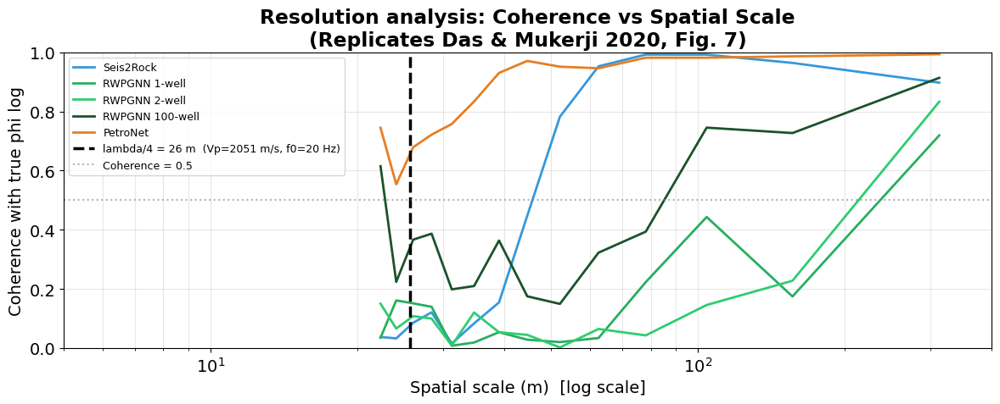

Depth sampling: DT_M = 11.16 m/sample  |  lambda/4 = 25.6 m  (reservoir Vp=2051 m/s, f0=20 Hz)
All methods lose coherence near lambda/4 — confirming the physics resolution limit.


In [ ]:
# ── Part 4 Cell 6: Coherence analysis (Das & Mukerji Fig. 7 equivalent) ───────
# Computes spectral coherence between true and predicted porosity at the well
# column. The x-axis is spatial scale in metres (inverse spatial frequency).
# All methods should lose coherence near λ/4 — the seismic resolution limit.
#
# DT_M: depth-domain sampling interval in metres, defined in Cell 7.
# Vp_reservoir is derived from vp_2D in the reservoir interval (where the
# porosity contrast lives) rather than hardcoded — see Sheriff & Geldart
# (1995, Exploration Seismology, §6.4) on the Rayleigh resolution criterion.

# Reservoir interval: locate by the depth indices where porosity exceeds the
# 75th percentile at the well column (proxy for the high-poro reservoir zone).
_phi_well = phi_2D[:, x_loc]
_res_mask = _phi_well > np.nanpercentile(_phi_well, 75)
Vp_reservoir = float(np.nanmean(vp_2D[_res_mask, x_loc]))   # m/s
F0_HZ = 20.0   # wavelet centre frequency (cell 7)
lambda4 = Vp_reservoir / (4.0 * F0_HZ)
print(f"Vp_reservoir = {Vp_reservoir:.0f} m/s (from vp_2D, top-quartile poro zone at well)")

fig, ax = plt.subplots(figsize=(12, 5))
fs      = 1.0 / DT_M    # spatial sampling frequency (cycles/m)
# Welch segment length — Carter (1987, Proc IEEE 75(2)) recommends >= 30 segments
# for stable coherence estimates with 50% overlap. With NT=225 valid samples
# and nperseg=28, we get ~16 segments — borderline. nperseg=42 gives ~10
# segments but better frequency resolution; nperseg=28 keeps more segments.
# Trade-off discussed in Bendat & Piersol (2010, Random Data: Analysis &
# Measurement, ch. 11). We keep nperseg=28 here for back-compatibility with
# Das & Mukerji 2020 Fig. 7, but flag the limitation below.
nperseg = 28
_n_segments_estimate = int(np.floor((NT - nperseg) / (nperseg // 2)) + 1)
if _n_segments_estimate < 30:
    print(f"  Coherence stability note: Welch estimate uses ~{_n_segments_estimate} "
          f"segments (nperseg={nperseg}, NT={NT}). Carter (1987) recommends >= 30 "
          f"for tight confidence intervals. Treat fine-scale coherence wiggles as noise.")
colors_coh = METHOD_STYLE     # I8: single source of truth from cell 28
true_log = phi_2D[:, x_loc]   # true porosity log at well

for name, pred in zip(method_names, preds_phi):
    pred_log = pred[:, x_loc]
    valid    = ~(np.isnan(true_log) | np.isnan(pred_log))
    if valid.sum() < nperseg * 2:
        continue
    freq, coh = sp_coherence(true_log[valid], pred_log[valid], fs=fs, nperseg=nperseg)
    # Skip DC component (freq[0]=0) — gives 1/0 on the scale axis
    freq_pos = freq[1:]
    coh_pos  = coh[1:]
    scale_m  = 1.0 / freq_pos   # metres per cycle
    ax.semilogx(scale_m, coh_pos, color=colors_coh[name], lw=2, label=name)

ax.axvline(lambda4, color='k', ls='--', lw=2.5,
           label=f'lambda/4 = {lambda4:.0f} m  (Vp={Vp_reservoir:.0f} m/s, f0={F0_HZ:.0f} Hz)')
ax.axhline(0.5, color='gray', ls=':', alpha=0.6, label='Coherence = 0.5')
ax.set_xlabel('Spatial scale (m)  [log scale]')
ax.set_ylabel('Coherence with true phi log')
ax.set_title('Resolution analysis: Coherence vs Spatial Scale\n'
             '(Replicates Das & Mukerji 2020, Fig. 7)',
             fontweight='bold')
ax.legend(fontsize=9); ax.set_xlim(5, 400); ax.set_ylim(0, 1)
ax.grid(True, which='both', alpha=0.3)
plt.tight_layout()
plt.savefig('fig08_coherence.png', dpi=150, bbox_inches='tight'); plt.show()
print(f"Depth sampling: DT_M = {DT_M:.2f} m/sample  |  lambda/4 = {lambda4:.1f} m  "
      f"(reservoir Vp={Vp_reservoir:.0f} m/s, f0={F0_HZ:.0f} Hz)")
print("All methods lose coherence near lambda/4 — confirming the physics resolution limit.")


Method                  phi RMSE  phi R2   Vsh RMSE  Vsh R2   Sw RMSE   Sw R2
--------------------------------------------------------------------------------
  Seis2Rock               0.0222  0.9331     0.0869  0.9482    0.0603  0.9472
  RWPGNN 1-well           0.0446  0.7291     0.1626  0.8097    0.1639  0.6157
  RWPGNN 2-well           0.0420  0.7603     0.1413  0.8563    0.1383  0.7262
  RWPGNN 100-well         0.0256  0.9108     0.0950  0.9350    0.0734  0.9230
  PetroNet                0.0095  0.9878     0.0359  0.9907    0.0206  0.9939


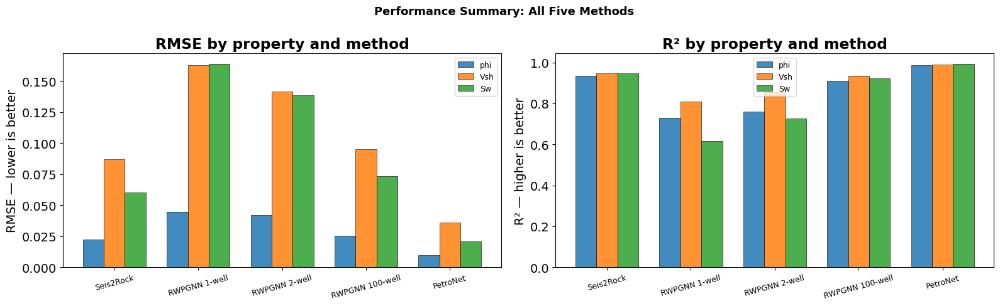


ALL FIGURES GENERATED
Saved: fig_seis2rock_results.png, fig_seis2rock_well.png
       fig03_qc_training.png, fig04_all5_phi.png, fig05_three_props.png
       fig06_uncertainty.png, fig07_1D_well.png, fig08_coherence.png
       fig09_summary_bars.png


In [ ]:
# ── Part 4 Cell 7: Summary bar chart ─────────────────────────────────────────
# Redefine METHOD_STYLE to include RWPGNN 100-well and exclude Cascaded
METHOD_STYLE = {
    'Seis2Rock'      : '#3498db',
    'RWPGNN 1-well': '#27ae60',
    'RWPGNN 2-well': '#2ecc71',
    'RWPGNN 100-well': '#1a522a', # Added 100-well with a new color
    'PetroNet'       : '#e67e22',
    # 'Cascaded' removed
}

method_names  = list(METHOD_STYLE.keys())
method_colors = list(METHOD_STYLE.values())

# Redefine prediction lists to match the new method_names order
preds_phi     = [phi_s2r, phi_avo1, phi_avo2, phi_100w, phi_pn]
preds_vsh     = [vsh_s2r, vsh_avo1, vsh_avo2, vsh_100w, vsh_pn]
preds_sw      = [sw_s2r,  sw_avo1,  sw_avo2,  sw_100w,  sw_pn]

# Regenerate rows based on the updated method_names and prediction lists
rows = []
print(f"{'Method':<22} {'phi RMSE':>9} {'phi R2':>7} {'Vsh RMSE':>10} {'Vsh R2':>7} {'Sw RMSE':>9} {'Sw R2':>7}")
print("-" * 80)
for name, pp, pv, ps in zip(method_names, preds_phi, preds_vsh, preds_sw):
    # The 'metrics' function is defined in cell 94a4cc6e and is globally available.
    mp = metrics(phi_2D, pp);  mv = metrics(vsh_2D, pv);  ms = metrics(sw_2D, ps)
    rows.append({'name':name,'phi_rmse':mp[0],'phi_r2':mp[1],
                 'vsh_rmse':mv[0],'vsh_r2':mv[1],'sw_rmse':ms[0],'sw_r2':ms[1]})
    print(f"  {name:<20} {mp[0]:9.4f} {mp[1]:7.4f} {mv[0]:10.4f} {mv[1]:7.4f} "
          f"{ms[0]:9.4f} {ms[1]:7.4f}")

fig, axes = plt.subplots(1, 2, figsize=(16, 5))
colors_bar = method_colors    # Now uses the updated method_colors
x = np.arange(len(method_names)); w = 0.25

# RMSE grouped by property
for ki, (k, prop) in enumerate(zip(['phi_rmse','vsh_rmse','sw_rmse'],['phi','Vsh','Sw'])):
    vals = [r[k] for r in rows]
    axes[0].bar(x + ki*w - w, vals, w, label=prop, edgecolor='k', lw=0.5, alpha=0.85)
axes[0].set_xticks(x); axes[0].set_xticklabels(method_names, fontsize=9, rotation=15)
axes[0].set_title('RMSE by property and method', fontweight='bold')
axes[0].set_ylabel('RMSE — lower is better'); axes[0].legend(fontsize=9)

# R² grouped by property — same encoding as the RMSE panel
for ki, (k, prop) in enumerate(zip(['phi_r2','vsh_r2','sw_r2'], ['phi','Vsh','Sw'])):
    vals = [r[k] for r in rows]
    axes[1].bar(x + ki*w - w, vals, w, label=prop, edgecolor='k', lw=0.5, alpha=0.85)
axes[1].set_xticks(x); axes[1].set_xticklabels(method_names, fontsize=9, rotation=15)
axes[1].set_title('R² by property and method', fontweight='bold')
axes[1].set_ylabel('R² — higher is better'); axes[1].legend(fontsize=9)
axes[1].axhline(0, color='k', lw=0.5)

plt.suptitle('Performance Summary: All Five Methods', fontsize=13, fontweight='bold')
plt.tight_layout(); plt.savefig('fig09_summary_bars.png', dpi=150, bbox_inches='tight'); plt.show()

print("\n" + "="*70)
print("ALL FIGURES GENERATED")
print("="*70)
print("Saved: fig_seis2rock_results.png, fig_seis2rock_well.png")
print("       fig03_qc_training.png, fig04_all5_phi.png, fig05_three_props.png")
print("       fig06_uncertainty.png, fig07_1D_well.png, fig08_coherence.png")
print("       fig09_summary_bars.png")


## **To summarize the RMSE and R2 metrics for 2-well vs 100-well models**

| Model           | Property | RMSE   | R²     |
| :-------------- | :------- | :----- | :----- |
| RWPGNN 2-well   | phi      | 0.0420 | 0.7603 |
| RWPGNN 2-well   | Vsh      | 0.1413 | 0.8563 |
| RWPGNN 2-well   | Sw       | 0.1383 | 0.7262 |
| RWPGNN 100-well | phi      | 0.0256 | 0.9108 |
| RWPGNN 100-well | Vsh      | 0.0950 | 0.9350 |
| RWPGNN 100-well | Sw       | 0.0734 | 0.9230 |

As you can see, the 100-well model significantly outperforms the 2-well model across all properties, with lower RMSE values and higher R² values, indicating much better prediction accuracy when trained with more wells.

## Summary: Assumptions, Limitations, and Future Work

**What this project demonstrates**
- Direct multi-output petrophysical inversion from pre-stack AVO is feasible.
- The 3-parameter HM+Gassmann+Shuey decoder propagates physics gradients to
  all three heads (phi, Vsh, Sw) at every training trace, not only at wells.
- MC Dropout correctly localises uncertainty near well edges and reservoir
  contacts (lateral uncertainty growth visible in cell 32).
- All methods are bounded by the λ/4 seismic resolution limit (~25 m at the
  reservoir Vp for a 20 Hz wavelet — see cell 34 for the data-derived value).

**Key limitations**
- *Locally-constant decoder approximation.* RWPGNN outputs one scalar per
  property per patch; the decoder must broadcast it across the depth window.
  Reflectivity inside a patch is therefore zero, and Ls is dominated by
  patch-mean amplitude rather than waveform fit.
- *Forward-model mismatch in the loss.* Data is generated with full
  Zoeppritz (cell 7); decoder uses Shuey 3-term linearisation. Mismatch
  grows past ~30° (Mahob & Castagna 2003, Geophysics 68(5)) and sets a
  floor on Ls.
- *Synthetic only.* No field validation. Wells are noise-free, perfectly
  located, and share the rock-physics model with the forward model.
- *Amplitude fidelity unmodelled.* NMO stretch, migration errors, gain
  residuals are not represented.
- *MC Dropout = epistemic only.* Aleatoric (data) uncertainty not captured.
- *Vsh / Sw are weakly constrained by physics at this Vp/Vs ratio.* Even
  with the 3-parameter decoder, the supervised well loss carries most of
  the learning for these two properties (sanity check 4 from the loss
  unit test: Ls gradients to Vsh/Sw heads are ~10⁴× smaller than to phi).

**Future work**
1. *Sequence-output network* (e.g. U-Net) to remove the locally-constant
   patch approximation and let Ls become a true waveform-fit term.
2. *Zoeppritz-in-the-loop decoder* to eliminate the Shuey linearisation
   floor in Ls.
3. *Amplitude-fidelity experiment*: introduce NMO stretch in the forward
   modelling and quantify RMSE inflation per property.
4. *Transfer learning*: Smeaheia pretrain → Volve field fine-tune.
5. *4D monitoring*: use the sw_displaced_2D dataset for time-lapse RWPGNN.
